# Machine Learning Pipeline - Interpretation

Check the python kernel we are using, should be the local one, not the one in the virtual environment

In [3]:
import sys
print(sys.executable)

/home/ieo7429/miniconda3/envs/gt/bin/python


## Import libraries

In [4]:
import numpy as np
import pandas as pd
import sklearn as sk
import seaborn as sns
import matplotlib.pyplot as plt
import scipy as sp
import xgboost as xgb
import shap
import warnings
import math
import pickle
import matplotlib.lines as mlines
import matplotlib.collections as mcollections
from collections import OrderedDict
from matplotlib import gridspec
from matplotlib.ticker import ScalarFormatter
from collections import Counter
from skopt import BayesSearchCV
from sklearn.feature_selection import SelectFromModel
from sklearn.preprocessing import StandardScaler
import pandas as pd
from scipy.stats import chi2_contingency
import umap
from sklearn.cluster import KMeans

## Define Variables

In [5]:
X_train_filename = "sc_Regression_Output_with_HIC_and_Repliseq_1Mbp/regression_X_train_red"
y_train_filename = "sc_Regression_Output_with_HIC_and_Repliseq_1Mbp/regression_y_train_red"
bin_train_filename = "sc_Regression_Output_with_HIC_and_Repliseq_1Mbp/regression_bin_train_red"
model_filename = "sc_Regression_Output_with_HIC_and_Repliseq_1Mbp/regressor_final_model"

In [6]:
regr_X_train_reduced = pickle.load(open(X_train_filename,"rb"))
regr_y_train = pickle.load(open(y_train_filename,"rb"))
regr_bin_train = pickle.load(open(bin_train_filename,"rb"))
regr_model = pickle.load(open(model_filename,"rb"))

backbone = pd.read_csv(filepath_or_buffer= "/home/ieo7429/Desktop/THESIS_GAB/tables/backbone_1Mbp.tsv", sep = "\t", header = 0)

## Residuals Analysis

In [7]:
regr_bin_train = regr_bin_train.squeeze()

In [8]:
y_train = pd.Series(regr_y_train)

In [9]:
predictions_array = regr_model.predict(regr_X_train_reduced)
predictions_array = pd.Series(predictions_array, index = regr_bin_train.index)

In [10]:
deltas = (regr_y_train - predictions_array).astype(float)

In [11]:
rownames = ["bin", "observed", "predicted", "residual"]

In [12]:
errors_df = pd.DataFrame([regr_bin_train, regr_y_train, predictions_array, deltas], index = rownames).transpose()
errors_df["idx"] = errors_df.index; errors_df = errors_df.astype({"residual":float})

[03-07-2025 14:50:02] [matplotlib.category] [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
[03-07-2025 14:50:02] [matplotlib.category] [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


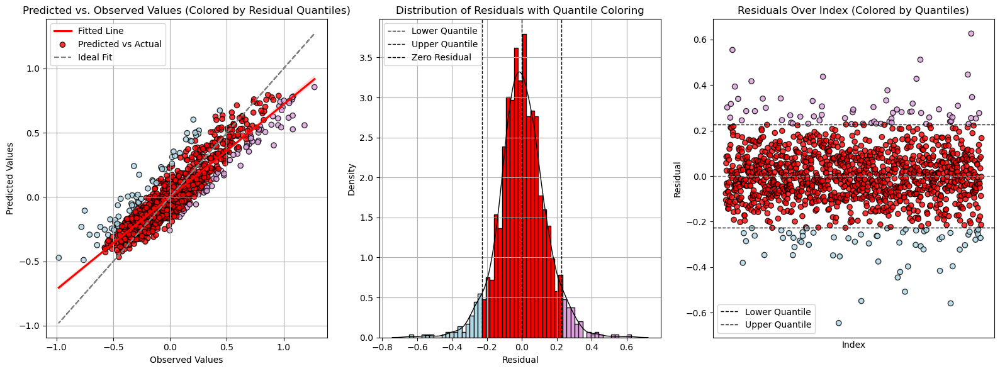

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

fig, axes = plt.subplots(1, 3, figsize=(16, 6))

residuals = errors_df['residual'].to_numpy()
upper_quantile = np.quantile(residuals, 0.95)
lower_quantile = -upper_quantile

colors_points = np.where(
    residuals < lower_quantile, 'lightblue',
    np.where(residuals > upper_quantile, 'plum', 'red')
)

y_true = y_train.to_numpy()
y_pred = predictions_array.to_numpy()

sns.regplot(x=y_true, y=y_pred, scatter=False, color='red', label='Fitted Line', ax=axes[0])
axes[0].scatter(y_true, y_pred, c=colors_points, edgecolor='black', alpha=0.8, label='Predicted vs Actual')
axes[0].plot(y_true, y_true, color='gray', linestyle='--', label='Ideal Fit')
axes[0].set_xlabel("Observed Values")
axes[0].set_ylabel("Predicted Values")
axes[0].set_title("Predicted vs. Observed Values (Colored by Residual Quantiles)")
axes[0].legend()
axes[0].grid(True)

bins = 55
hist, bin_edges = np.histogram(residuals, bins=bins, density=True)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

# Determine color for each bin center based on quantiles
colors_hist = np.where(
    bin_centers < lower_quantile, 'lightblue',
    np.where(bin_centers > upper_quantile, 'plum', 'red')
)

for count, x, left, right, color in zip(hist, bin_centers, bin_edges[:-1], bin_edges[1:], colors_hist):
    axes[1].bar(x, count, width=right-left, color=color, edgecolor='black', align='center')

sns.kdeplot(residuals, color='black', linewidth=1, ax=axes[1])
axes[1].axvline(lower_quantile, color='black', linestyle='--', linewidth=1, label='Lower Quantile')
axes[1].axvline(upper_quantile, color='black', linestyle='--', linewidth=1, label='Upper Quantile')
axes[1].axvline(0, color='black', linestyle='--', linewidth=1, label='Zero Residual')
axes[1].set_xlabel("Residual")
axes[1].set_ylabel("Density")
axes[1].set_title("Distribution of Residuals with Quantile Coloring")
axes[1].legend()
axes[1].grid(True)

axes[2].scatter(
    errors_df.index, residuals, 
    c=colors_points, edgecolor='black', alpha=0.8
)
axes[2].axhline(0, color='gray', linestyle='--', linewidth=1)
axes[2].axhline(lower_quantile, color='black', linestyle='--', linewidth=1, label='Lower Quantile')
axes[2].axhline(upper_quantile, color='black', linestyle='--', linewidth=1, label='Upper Quantile')
axes[2].set_xlabel("Index")
axes[2].set_ylabel("Residual")
axes[2].set_title("Residuals Over Index (Colored by Quantiles)")
axes[2].legend()
axes[2].set_xticks([])
axes[2].grid(False)

plt.tight_layout()
plt.show()

In [46]:
# pensa di aggiungere il discorso fatto con martin
# still to be continued, but idea would be that if a key variable, possibly encoding for a driver event is missing, 
# AND that event is significant you would theoretically observe the regions you are interested in the bottom
# right part of the residuals. 

In [47]:
# why I used simple predictions instead of cross validated predictions? Later on SHAP uses simple predictions, 
# so I wanted to keep homogeneous predictions

## SHAP analysis - Sign UNAWARE annotation

In [82]:
explainer = shap.TreeExplainer(regr_model, approximate= False)
shap_values = explainer(regr_X_train_reduced)

In [ ]:
shap_vals_df = pd.DataFrame(shap_values.values, columns= regr_X_train_reduced.columns, index = regr_X_train_reduced.index)

In [14]:
scaler = StandardScaler()
scaled_train = pd.DataFrame(scaler.fit_transform(regr_X_train_reduced), columns = regr_X_train_reduced.columns, index = regr_X_train_reduced.index)

/home/ieo7429/miniconda3/envs/gt/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ieo7429/miniconda3/envs/gt/lib/python3.13/site-packages/sklearn/utils/extmath.py:1150: RuntimeWarning: invalid value encountered in subtract
  temp = X - T
/home/ieo7429/miniconda3/envs/gt/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ieo7429/miniconda3/envs/gt/lib/python3.13/site-packages/sklearn/preprocessing/_data.py:1096: RuntimeWarning: invalid value encountered in subtract
  X -= self.mean_


In [15]:
associated_chr = regr_bin_train.str.split("_").apply(lambda x: x[0])

### One Feature Annotation

In [16]:
cols_idxs = np.argmax(np.abs(shap_vals_df), axis = 1)

cols_occurrences = pd.Series(regr_X_train_reduced.columns[cols_idxs], index= regr_bin_train.index, name = "annotation")
extracted_values = pd.Series([shap_vals_df.iloc[i, cols_idxs[i]] for i in range(len(shap_vals_df))], 
                             index = regr_X_train_reduced.index, name= "associated_shap")

annot_with_bins = pd.concat([regr_bin_train, cols_occurrences, extracted_values], axis = 1)

annot_with_coords = pd.merge(left = annot_with_bins, right = backbone, how = "inner", on = "bin")
annot_with_coords = pd.merge(left = annot_with_coords, right = errors_df[["bin","predicted"]], how = "inner", on = "bin")
annot_with_coords = annot_with_coords[["bin", "chr", "start", "end", "annotation", "associated_shap", "predicted"]]

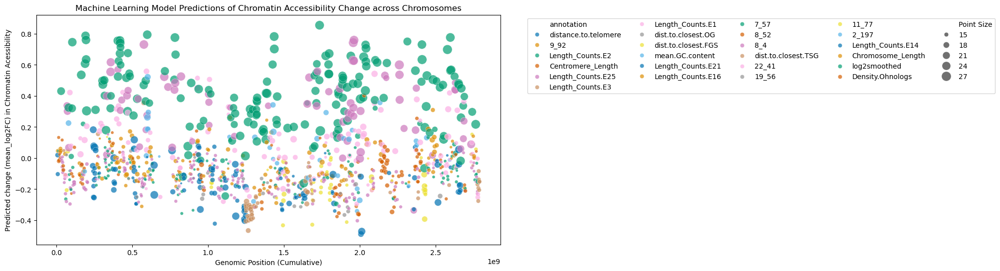

In [17]:
df = annot_with_coords.copy(deep = True)

df["midpoint"] = (df["start"] + df["end"]) / 2

df.sort_values(["chr", "start"], inplace=True)

chr_offsets = {chrom: offset for chrom, offset in zip(df["chr"].unique(), np.cumsum([0] + list(df.groupby("chr")["end"].max()[:-1])))}
df["cumulative_midpoint"] = df["midpoint"] + df["chr"].map(chr_offsets)

df["Point Size"] = (df["associated_shap"].abs() * 100) + 10

plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=df,
    x="cumulative_midpoint",
    y="predicted",
    hue="annotation",
    size="Point Size",
    sizes=(10, 200),
    palette="colorblind",
    alpha=0.7
)

plt.xlabel("Genomic Position (Cumulative)")
plt.ylabel("Predicted change (mean_log2FC) in Chromatin Acessibility")
plt.title("Machine Learning Model Predictions of Chromatin Accessibility Change across Chromosomes")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', ncol = 5)

plt.savefig('./imgs/sc_1Mbp_bubble.png')
plt.show()

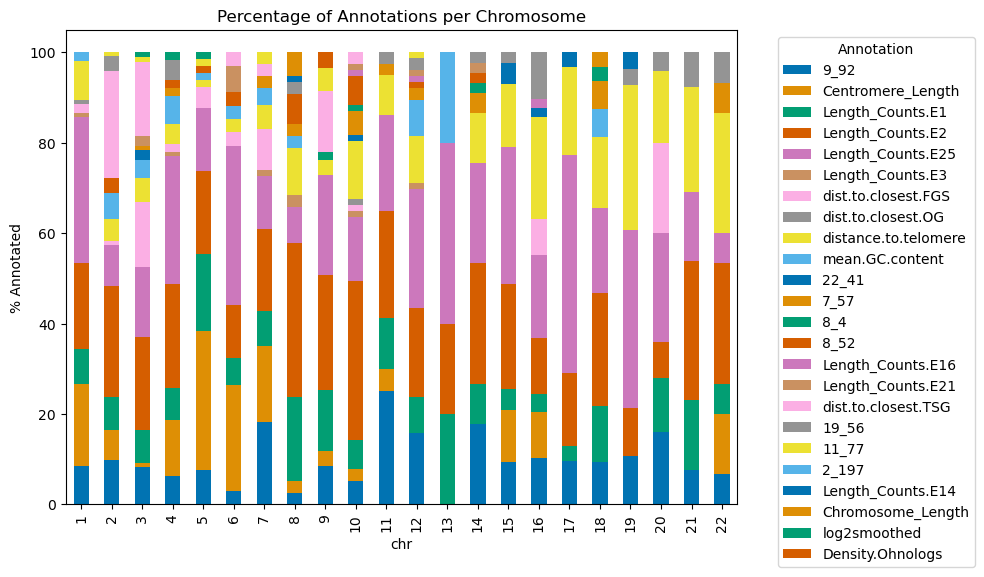

In [18]:
annot_count_per_chr = df.groupby(["chr","annotation"]).count().loc[:,"bin"].reset_index().rename(columns={"bin": "annot_counts"})
bin_counts_per_chr = df.groupby(["chr"]).count().loc[:,"bin"].reset_index().rename(columns={"bin": "bin_count"})

merged_df = annot_count_per_chr.merge(bin_counts_per_chr, on='chr', how='inner')
merged_df["perc_annot"] = (merged_df["annot_counts"] / merged_df["bin_count"])*100

import matplotlib.pyplot as plt
import seaborn as sns

annotation_order = merged_df['annotation'].drop_duplicates().tolist()

pivot_df = merged_df.pivot(index='chr', columns='annotation', values='perc_annot').fillna(0)
pivot_df = pivot_df[annotation_order]

pivot_df = pivot_df.set_index(pivot_df.index.str.replace("chr","").astype(int))
pivot_df = pivot_df.sort_index()

n_colors = len(annotation_order)
colors = sns.color_palette("colorblind", n_colors=n_colors)
pivot_df.plot(kind='bar', stacked=True, color=colors, figsize=(10, 6))

plt.ylabel('% Annotated')
plt.title('Percentage of Annotations per Chromosome')
plt.legend(title='Annotation', bbox_to_anchor=(1.05, 1), loc='upper left', ncol = 1)
plt.tight_layout()
plt.show()

In [20]:
# E25, E2 and E1 dominate predictions across all chromosomes
# FGS for chr20
# distance to telomere for chr19
# chr13 is driven by just 4 features
# distance to telomere only for smaller chromosomes

### Clustermap Analyasis

In [77]:
shap_vals_df

,ampl_score,del_score,mean.GC.content,total_n_ohnologs.mmpaper_trans,dist.to.closest.FGS,Length_Counts.E1,Length_Counts.E12,Length_Counts.E14,Length_Counts.E16,Length_Counts.E2,...,6_135,9_92,22_41,4_154,15_13,7_51,2_197,8_52,7_57,log2smoothed
307,0.032106,0.007087,0.029741,0.012793,-0.000198,0.053355,0.011624,-0.038497,0.000706,0.146001,...,-0.005078,-0.021323,-0.027902,0.014720,-0.007415,-0.021721,0.026360,-0.020490,0.024407,0.050979
539,-0.005442,-0.012047,-0.016264,-0.006035,0.001650,-0.020316,-0.008943,0.003350,-0.004257,-0.035183,...,0.002879,0.041331,-0.016758,0.009483,-0.001468,0.004365,0.005267,0.031541,-0.012192,-0.009904
1212,-0.008474,0.015447,-0.007502,-0.007144,-0.003092,0.071584,-0.000054,0.013030,-0.007598,0.007602,...,-0.003036,-0.004618,-0.002651,0.014013,0.001653,-0.001272,-0.018073,0.017999,0.020483,-0.011793
646,-0.011485,0.020239,-0.009115,-0.002615,0.013038,0.061289,0.026803,-0.002395,0.055315,-0.026203,...,0.007580,0.044606,0.028527,0.016502,0.011724,-0.002850,-0.013971,0.042870,-0.016412,0.013606
1131,0.007944,0.003010,0.004682,0.012776,-0.029013,0.054635,-0.002571,0.013406,-0.008311,-0.033704,...,-0.011246,-0.031008,-0.030089,-0.006332,0.011897,0.014880,0.011572,-0.010004,-0.010153,-0.002641
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,-0.017984,0.025417,0.028489,0.008402,-0.044929,0.056231,0.031814,-0.030180,0.006638,-0.026095,...,-0.007521,0.061715,0.004972,0.000813,-0.004128,-0.000325,-0.016010,0.000661,0.030032,0.013475
373,0.004246,0.010831,-0.018902,-0.010413,-0.003823,0.059156,0.008331,0.012625,0.001738,-0.030219,...,0.009797,-0.023767,0.035663,0.014329,0.014265,0.017814,-0.020809,-0.011798,-0.013938,0.046188
1460,0.004223,-0.005296,-0.013033,0.009217,0.023576,0.063512,0.014254,0.013174,-0.012169,0.138888,...,-0.002404,0.046618,-0.036190,0.010847,-0.013108,-0.003547,-0.016122,-0.006718,0.032044,-0.000909
51,-0.002792,-0.002436,-0.036966,-0.005100,0.019931,-0.039974,-0.003893,-0.026731,-0.007402,-0.040825,...,-0.000665,-0.028662,0.010937,0.002085,0.006174,0.009816,0.016269,-0.011306,-0.005059,-0.015690


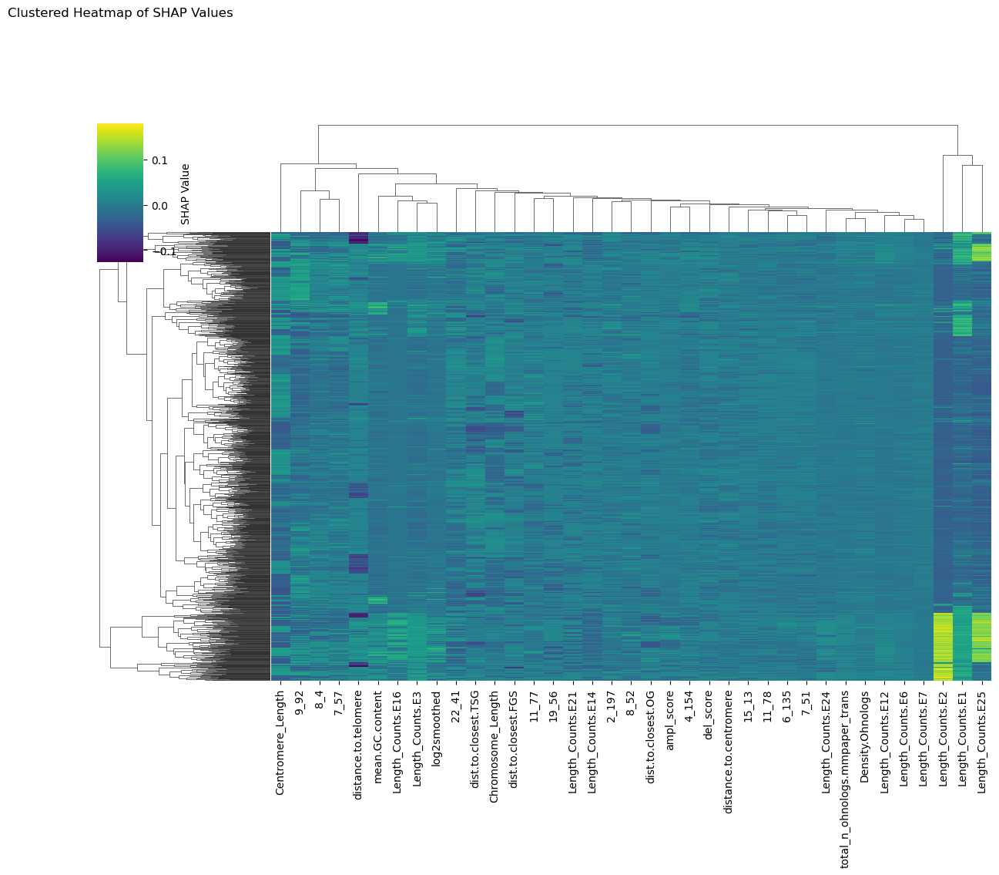

In [81]:
# how do regions cluster together based on SHAP values

p = sns.clustermap(
        shap_vals_df,
        cmap="viridis",
        figsize=(12, 10),
        xticklabels=True,
        yticklabels=False,
        col_cluster=True,
        row_cluster=True,
        metric='euclidean',
        method='complete',
        cbar_kws={'label': 'SHAP Value'}
    )

p
plt.title('Clustered Heatmap of SHAP Values', pad=100)
plt.show()

In [20]:
clustering_idxs = p.dendrogram_row.reordered_ind
reordered_mat = shap_vals_df.iloc[clustering_idxs]
reordered_train = regr_X_train_reduced.iloc[clustering_idxs]

scaler = StandardScaler()
scaled_train = pd.DataFrame(scaler.fit_transform(reordered_train), columns = reordered_train.columns, index = reordered_train.index)

subsetted_matrix = reordered_mat.loc[:,["distance.to.telomere","Length_Counts.E2","Length_Counts.E1","Length_Counts.E25"]]
subsetted_train = scaled_train.loc[:,["distance.to.telomere","Length_Counts.E2","Length_Counts.E1","Length_Counts.E25"]]
thr_mat = pd.DataFrame(np.where(subsetted_matrix > 0.04, 1, np.where(subsetted_matrix < -0.04, -1, 0)), columns = subsetted_matrix.columns)

/home/ieo7429/miniconda3/envs/gt/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ieo7429/miniconda3/envs/gt/lib/python3.13/site-packages/sklearn/utils/extmath.py:1150: RuntimeWarning: invalid value encountered in subtract
  temp = X - T
/home/ieo7429/miniconda3/envs/gt/lib/python3.13/site-packages/numpy/_core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/home/ieo7429/miniconda3/envs/gt/lib/python3.13/site-packages/sklearn/preprocessing/_data.py:1096: RuntimeWarning: invalid value encountered in subtract
  X -= self.mean_


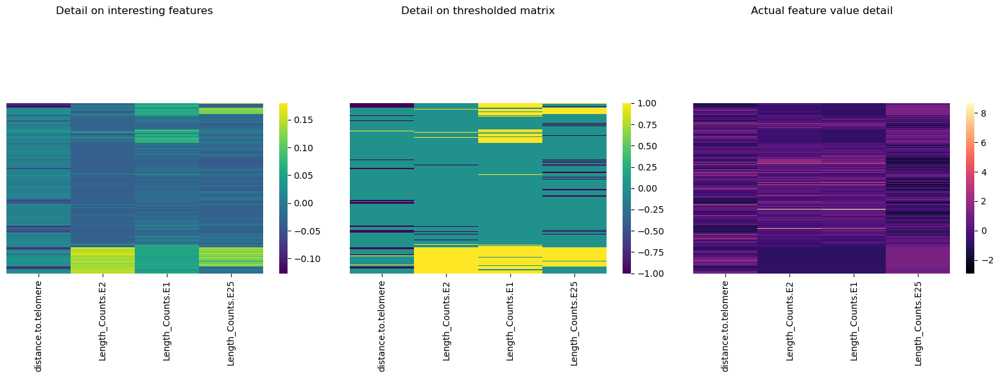

In [21]:
fig, axes = plt.subplots(1, 3, figsize=(16, 6))

p1 = sns.heatmap(
        subsetted_matrix,
        cmap="viridis",
        xticklabels=True,
        yticklabels=False,
        ax = axes[0]
    )

axes[0].set_title('Detail on interesting features', pad=100)

p2 = sns.heatmap(
        thr_mat,
        cmap="viridis",
        xticklabels=True,
        yticklabels=False,
        ax = axes[1]
    )

axes[1].set_title('Detail on thresholded matrix', pad=100)

p3 = sns.heatmap(
        subsetted_train,
        cmap="magma",
        xticklabels=True,
        yticklabels=False,
        ax = axes[2]
    )

axes[2].set_title('Actual feature value detail', pad=100)

plt.tight_layout()
plt.show()

In [48]:
# fraction of ptomoters and pathways

# features do not behave exclusively. 
# - Sometimes there is E2 high and E25 high,
# - Sometimes just E1 high
# - Sometimes E25 high, E2 low
# - Sometimes E2 high, E25 low      
# 
# 
# the top of the matrix shows high e25, low dist.telomere --> telomeric regions?                    

### K-means Clustering

In [22]:
warnings.filterwarnings("ignore")

kmeans = KMeans(n_clusters=5, random_state=4843)
kmeans.fit(shap_vals_df)
labels = kmeans.labels_
cluster_centers = kmeans.cluster_centers_

### SBM Clustering

In [23]:
import numpy as np
import scipy.sparse as sp
import random
from sklearn.metrics.pairwise import euclidean_distances
from graph_tool.all import Graph
from graph_tool.inference import minimize_blockmodel_dl
import graph_tool as gt

np.random.seed(123)
random.seed(123)
gt.seed_rng(123)

X = shap_values.values
sim_matrix = 1 / (1 + euclidean_distances(X))

k = 10
n = sim_matrix.shape[0]
adj = np.zeros_like(sim_matrix)

for i in range(n):
    top_k = np.argsort(sim_matrix[i])[-(k+1):-1]
    adj[i, top_k] = 1

adj = np.maximum(adj, adj.T)

sparse_adj = sp.csr_matrix(adj)

g = Graph(sparse_adj, directed=False)

state = minimize_blockmodel_dl(g, state_args={"seed": 123},  multilevel_mcmc_args={"niter": 1})

blocks = state.get_blocks()
block_labels = [blocks[v] for v in g.vertices()]

n_blocks = state.get_nonempty_B()
print(f"Discovered {n_blocks} SHAP behavior clusters")

Discovered 32 SHAP behavior clusters


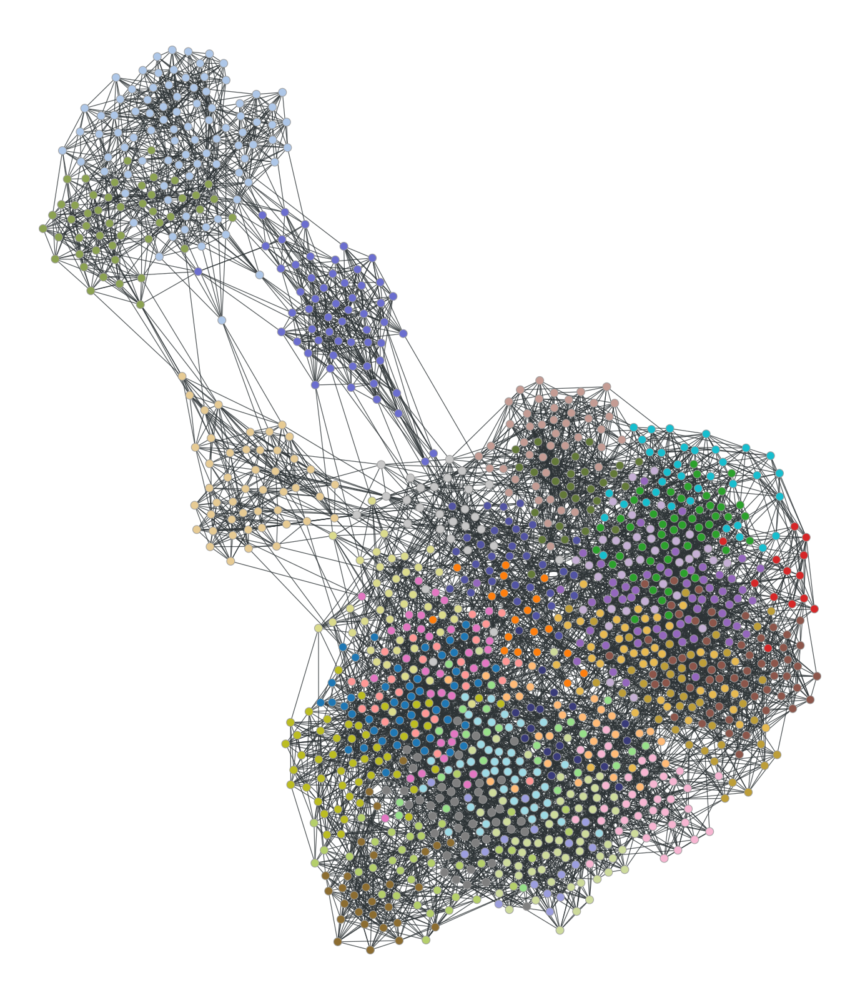

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc384bf46e0, at 0x7fc384b3fe00>

In [24]:
from graph_tool.draw import graph_draw

graph_draw(g, vertex_fill_color=blocks, output_size=(800, 800))

Discovered 17 SHAP behavior clusters


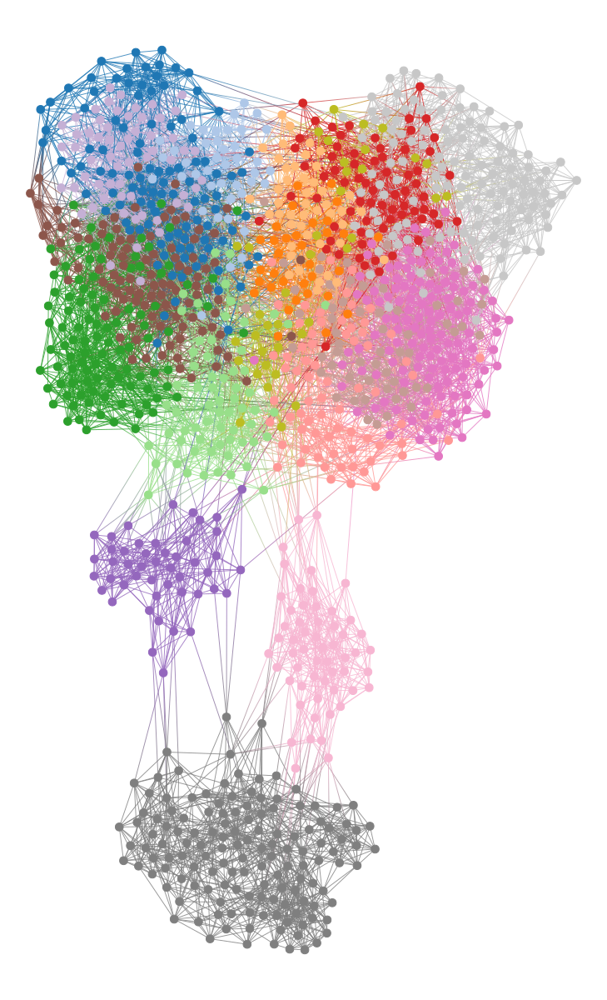

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc3d89b1350, at 0x7fc42af07cb0>

In [25]:
import numpy as np
import scipy.sparse as sp
import random
from sklearn.metrics.pairwise import euclidean_distances
from graph_tool.all import Graph
from graph_tool.inference import minimize_nested_blockmodel_dl
import graph_tool as gt

np.random.seed(123)
random.seed(123)
gt.seed_rng(123)

X = shap_values.values
sim_matrix = 1 / (1 + euclidean_distances(X))

k = 10
n = sim_matrix.shape[0]
adj = np.zeros_like(sim_matrix)

for i in range(n):
    top_k = np.argsort(sim_matrix[i])[-(k+1):-1]
    adj[i, top_k] = 1

adj = np.maximum(adj, adj.T)

sparse_adj = sp.csr_matrix(adj)

g = Graph(sparse_adj, directed=False)

state = minimize_nested_blockmodel_dl(g, state_args={"seed": 123}, multilevel_mcmc_args={"niter": 1})

k_level_state = state.project_level(1)
blocks = k_level_state.get_blocks()
block_labels = [blocks[v] for v in g.vertices()]

n_blocks = k_level_state.get_nonempty_B()
print(f"Discovered {n_blocks} SHAP behavior clusters")

k_level_state.draw()

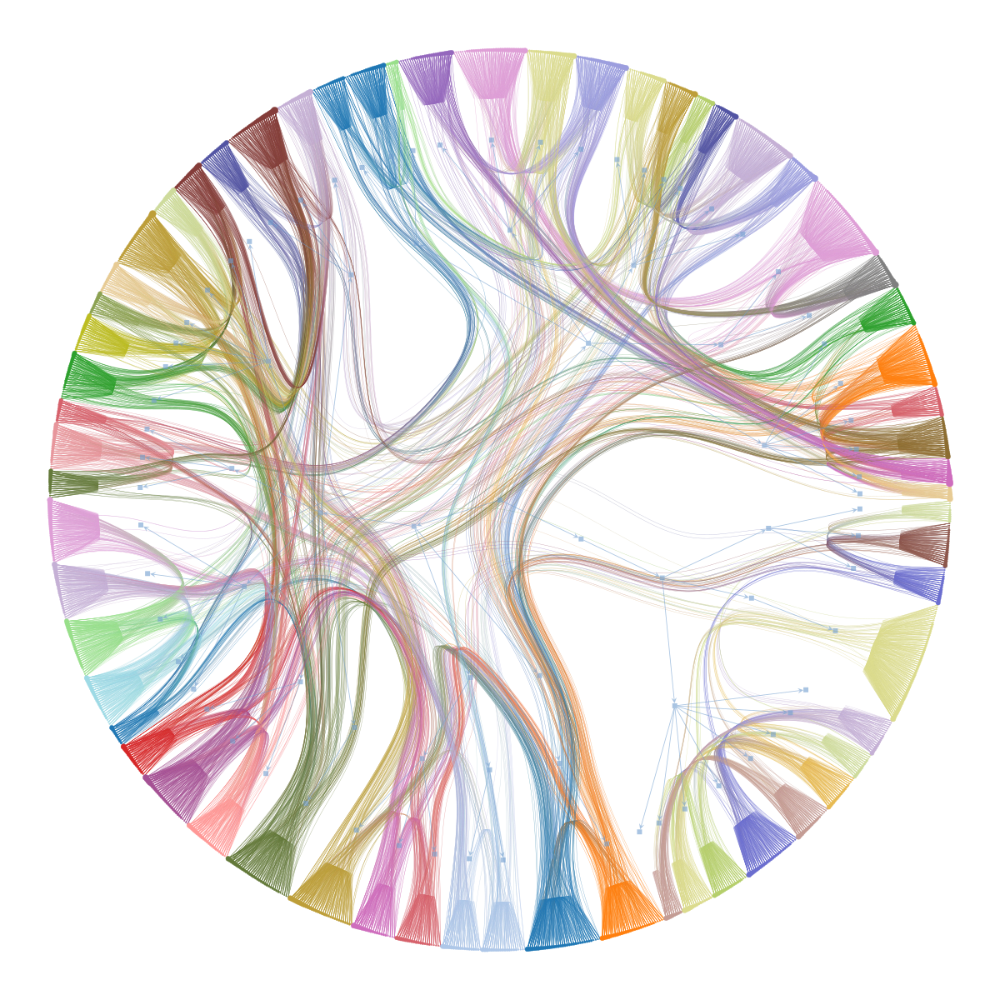

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc3d89b1350, at 0x7fc42af2d780>,
 <GraphView object, directed, with 1354 vertices and 1353 edges, edges filtered by <EdgePropertyMap object with value type 'bool', for Graph 0x7fc384bf13b0, at 0x7fc42af07700>, vertices filtered by <VertexPropertyMap object with value type 'bool', for Graph 0x7fc384bf13b0, at 0x7fc42af07d90>, at 0x7fc384bf13b0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fc384bf13b0, at 0x7fc42af2c520>)

In [26]:
state.draw()

In [27]:
blocks = k_level_state.get_blocks()
block_labels_array = np.array([blocks[v] for v in g.vertices()])

In [28]:
block_labels_array

array([54, 29, 33, ..., 35, 43, 15], shape=(1267,))

In [ ]:
import plotly.graph_objects as go
import pandas as pd

df = pd.DataFrame({'cluster_1': block_labels_array, 'cluster_2': labels})

transition_counts = df.groupby(['cluster_1', 'cluster_2']).size().reset_index(name='count')

cluster_1_labels = [f"C1_{i}" for i in sorted(df['cluster_1'].unique())]
cluster_2_labels = [f"C2_{i}" for i in sorted(df['cluster_2'].unique())]
all_labels = cluster_1_labels + cluster_2_labels

label_to_index = {label: i for i, label in enumerate(all_labels)}

sources = [label_to_index[f"C1_{row['cluster_1']}"] for _, row in transition_counts.iterrows()]
targets = [label_to_index[f"C2_{row['cluster_2']}"] for _, row in transition_counts.iterrows()]
values  = transition_counts['count'].tolist()

fig = go.Figure(data=[go.Sankey(
    node=dict(pad=15, thickness=20, line=dict(color="black", width=0.5),
              label=all_labels),
    link=dict(source=sources, target=targets, value=values)
)])
fig.update_layout(title_text="Clustering Sankey Diagram", font_size=12)
fig.show()


### UMAP analysis

In [30]:
umap_model = umap.UMAP(n_components=2, random_state=42)
umap_embedding = umap_model.fit_transform(shap_vals_df)
umap_df = pd.DataFrame(umap_embedding, columns=["UMAP1", "UMAP2"], index = shap_vals_df.index)

driving_feats = np.abs(shap_vals_df).idxmax(axis=1)
umap_df["driving_feats"] = driving_feats
umap_df["labels"] = labels
umap_df["nSBM_labels"] = block_labels_array
umap_df["residuals"] = errors_df.residual
umap_df["residuals_sign"] = np.where(errors_df.residual < lower_quantile, -1, np.where(errors_df.residual > upper_quantile, 1, 0))
umap_df["observed"] = regr_y_train
umap_df["predicted"] = errors_df["predicted"]
umap_df["scaled_E25"] = scaled_train["Length_Counts.E25"] 
umap_df["scaled_E2"] = scaled_train["Length_Counts.E2"]
umap_df["scaled_E1"] = scaled_train["Length_Counts.E1"]
umap_df["scaled_telomere"] = scaled_train["distance.to.telomere"]
umap_df["scaled_ampl"] = scaled_train["ampl_score"]
umap_df["scaled_del"] = scaled_train["del_score"]
umap_df["chr"] = associated_chr
umap_df["shap_E25"] = shap_vals_df["Length_Counts.E25"] 
umap_df["shap_E2"] = shap_vals_df["Length_Counts.E2"]
umap_df["shap_E1"] = shap_vals_df["Length_Counts.E1"]
umap_df["shap_telomere"] = shap_vals_df["distance.to.telomere"]
umap_df["shap_ampl"] = shap_vals_df["ampl_score"]
umap_df["shap_del"] = shap_vals_df["del_score"]
umap_df["GC_scaled"] = scaled_train["mean.GC.content"]
umap_df["GC_shap"] = shap_vals_df["mean.GC.content"]

elems_per_cluster = umap_df.groupby("labels").size().reset_index(name="elems_per_cluster")

centers_2d = umap_model.transform(cluster_centers)

In [31]:
vmin = float(shap_vals_df.values.min())
vmax = float(shap_vals_df.values.max())

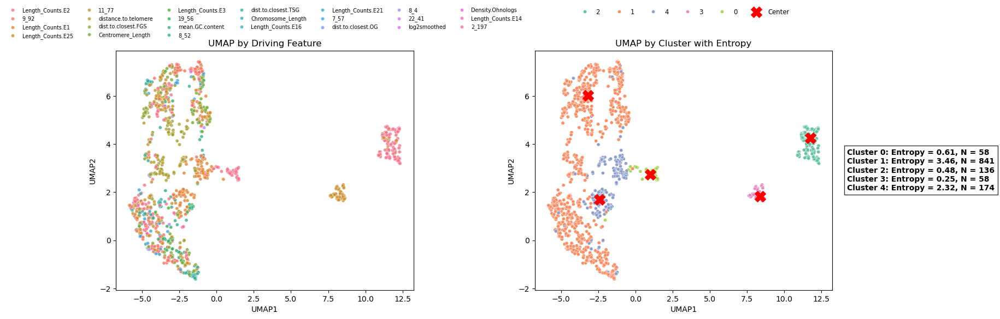

In [32]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
from collections import Counter

umap_df["labels"] = umap_df["labels"].astype(str)

unique_labels = sorted(umap_df["labels"].unique())
palette_clusters = sns.color_palette("Set2", n_colors=len(unique_labels))

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

sns.scatterplot(
    x="UMAP1", y="UMAP2", hue="labels", palette=palette_clusters,
    data=umap_df, s=20, ax=axes[1], legend=True
)

axes[1].scatter(
    centers_2d[:, 0], centers_2d[:, 1], c='red', marker='X', s=200, label='Center'
)

axes[1].set_title("UMAP by Cluster with Entropy")

cluster_info_lines = []
for i, center in enumerate(centers_2d):
    idxs = np.where(umap_df["labels"] == str(i))[0]  # Use string comparison
    cluster_df = umap_df.iloc[idxs]
    cluster_true_labels = cluster_df["driving_feats"]
    
    total = len(cluster_true_labels)
    counts = Counter(cluster_true_labels)
    probs = [count / total for count in counts.values()]
    ent = sp.stats.entropy(probs, base=2)
    
    cluster_info_lines.append(f"Cluster {i}: Entropy = {ent:.2f}, N = {total}")

text_str = "\n".join(cluster_info_lines)
axes[1].text(
    1.05, 0.5, text_str,
    transform=axes[1].transAxes,
    fontsize=10, fontweight='bold',
    va='center', ha='left',
    bbox=dict(facecolor='white', alpha=0.8, edgecolor='black')
)

handles0, labels0 = axes[1].get_legend_handles_labels()
axes[1].legend(
    handles=handles0, labels=labels0,
    loc='upper center', bbox_to_anchor=(0.5, 1.20),
    ncol=7, fontsize='small', frameon=False
)

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="driving_feats", s=20, alpha=0.8, ax=axes[0], legend=True
)
axes[0].set_title("UMAP by Driving Feature")

handles1, labels1 = axes[0].get_legend_handles_labels()
axes[0].legend(
    handles=handles1, labels=labels1,
    loc='upper center', bbox_to_anchor=(0.5, 1.20),
    ncol=7, fontsize='x-small', frameon=False
)

plt.tight_layout()
plt.show()

<Axes: xlabel='UMAP1', ylabel='UMAP2'>

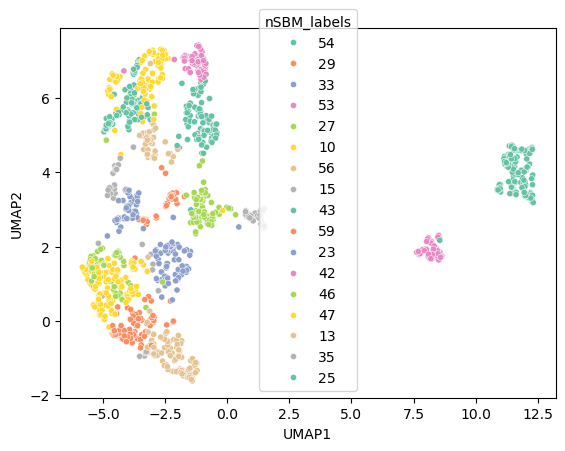

In [33]:
umap_df["nSBM_labels"] = umap_df["nSBM_labels"].astype(str)

unique_labels = sorted(umap_df["nSBM_labels"].unique())
palette_clusters = sns.color_palette("Set2", n_colors=len(unique_labels))

sns.scatterplot(
    x="UMAP1", y="UMAP2", hue="nSBM_labels", palette=palette_clusters,
    data=umap_df, s=20, legend=True
)

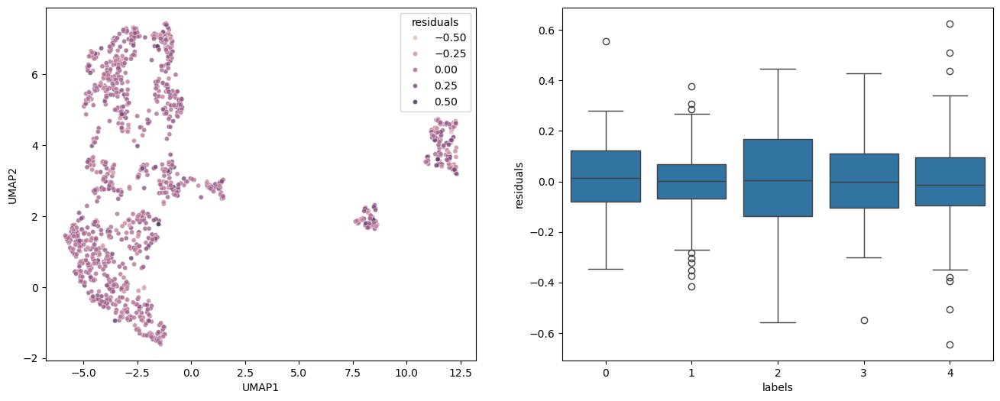

In [34]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="residuals", s=20, alpha=0.8, legend=True, ax=axes[0]
)

sns.boxplot(data=umap_df, x="labels", y="residuals", ax=axes[1])

plt.show()


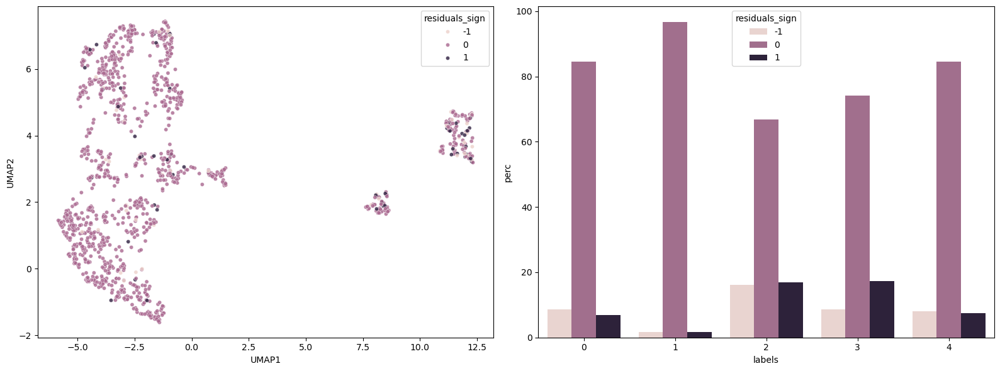

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="residuals_sign", s=20, alpha=0.8, legend=True, ax=axes[0]
)

umap_df_discrete = (
    umap_df.groupby(["labels", "residuals_sign"])
    .size()
    .reset_index(name="counts")
)

umap_df_discrete["labels"] = umap_df_discrete["labels"].astype(int)
elems_per_cluster["labels"] = elems_per_cluster["labels"].astype(int)

umap_df_discrete = umap_df_discrete.merge(elems_per_cluster, on = "labels")
umap_df_discrete["perc"] = (umap_df_discrete.counts / umap_df_discrete.elems_per_cluster) * 100

barplot = sns.barplot(
    data=umap_df_discrete, x="labels", y="perc",
    hue="residuals_sign", ax=axes[1]
)

plt.tight_layout()
plt.show()

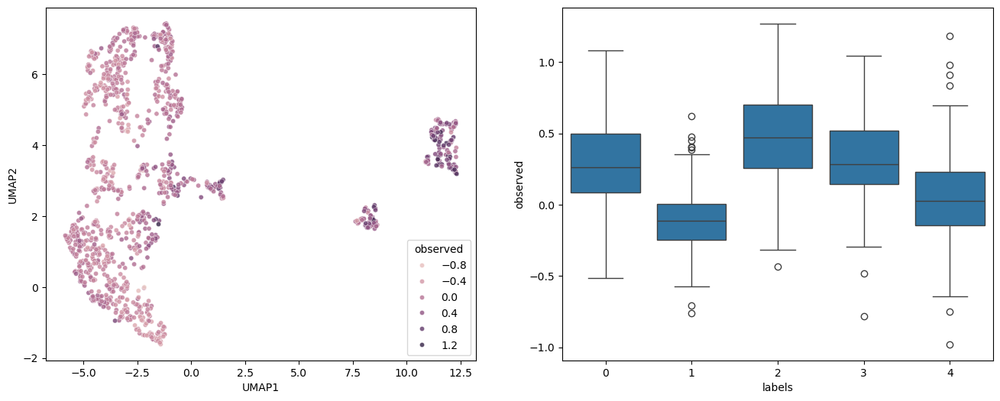

In [36]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="observed", s=20, alpha=0.8, legend=True, ax = axes[0])

sns.boxplot(data = umap_df, x = "labels", y = "observed", ax = axes[1])

plt.show()

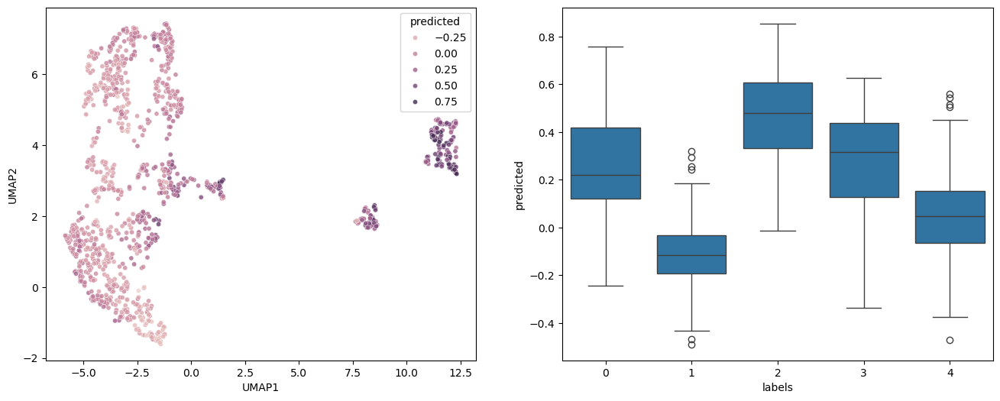

In [37]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="predicted", s=20, alpha=0.8, legend=True, ax = axes[0])

sns.boxplot(data = umap_df, x = "labels", y = "predicted", ax = axes[1])

plt.show()

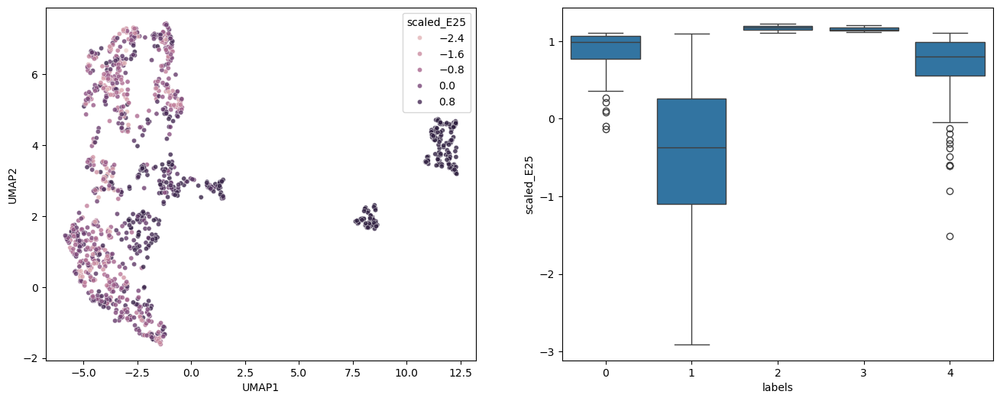

In [38]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="scaled_E25", s=20, alpha=0.8, legend=True, ax = axes[0])

sns.boxplot(data = umap_df, x = "labels", y = "scaled_E25", ax = axes[1])

plt.show()

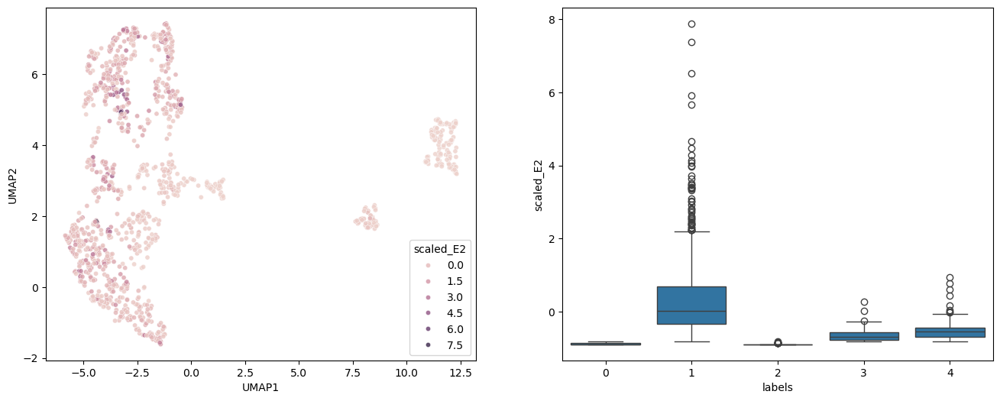

In [39]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="scaled_E2", s=20, alpha=0.8, legend=True, ax = axes[0])

sns.boxplot(data = umap_df, x = "labels", y = "scaled_E2", ax = axes[1])

plt.show()

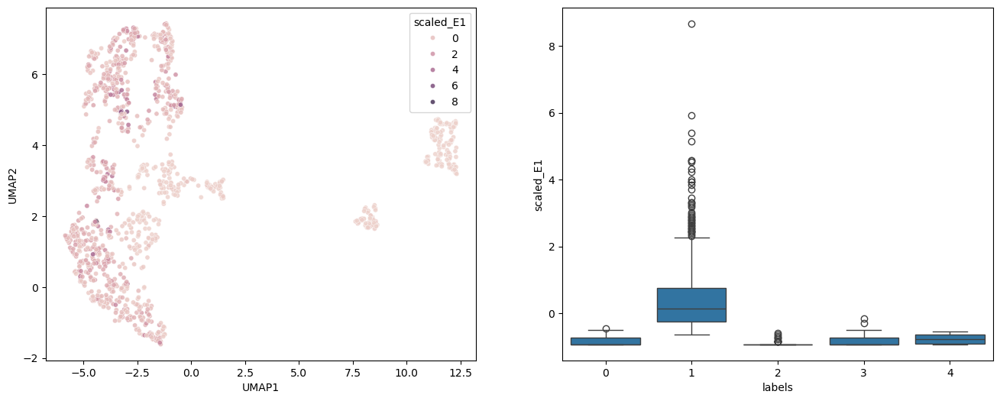

In [40]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="scaled_E1", s=20, alpha=0.8, legend=True, ax = axes[0])

sns.boxplot(data = umap_df, x = "labels", y = "scaled_E1", ax = axes[1])

plt.show()

In [41]:
import scipy as sp 
print(sp.stats.spearmanr(a=umap_df.scaled_E2, b = umap_df.scaled_E1))
print(sp.stats.spearmanr(a=umap_df.scaled_E2, b = umap_df.scaled_E25))

SignificanceResult(statistic=np.float64(0.8420523250274287), pvalue=np.float64(0.0))
SignificanceResult(statistic=np.float64(-0.8062914845762476), pvalue=np.float64(9.638262333205317e-291))


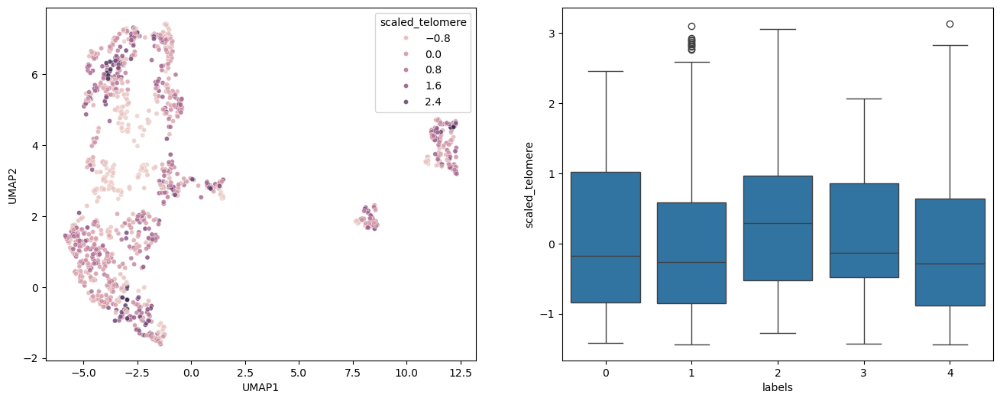

In [42]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="scaled_telomere", s=20, alpha=0.8, legend=True, ax = axes[0])

sns.boxplot(data = umap_df, x = "labels", y = "scaled_telomere", ax = axes[1])

plt.show()

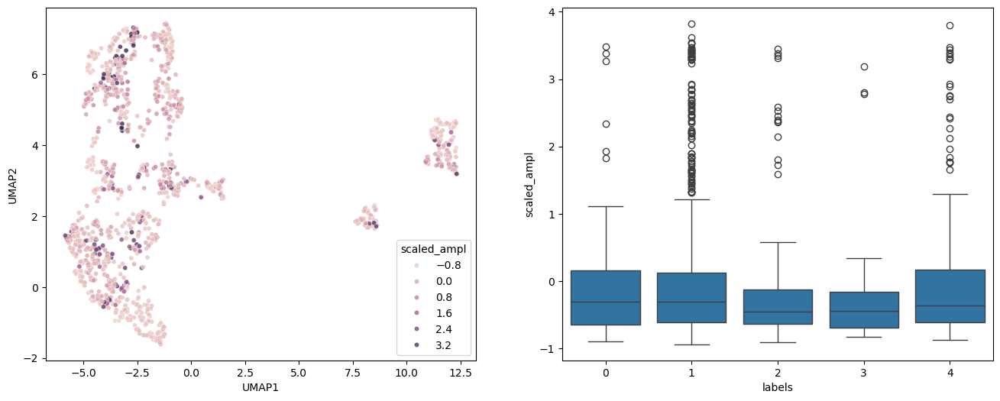

In [43]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="scaled_ampl", s=20, alpha=0.8, legend=True, ax = axes[0])

sns.boxplot(data = umap_df, x = "labels", y = "scaled_ampl", ax = axes[1])

plt.show()

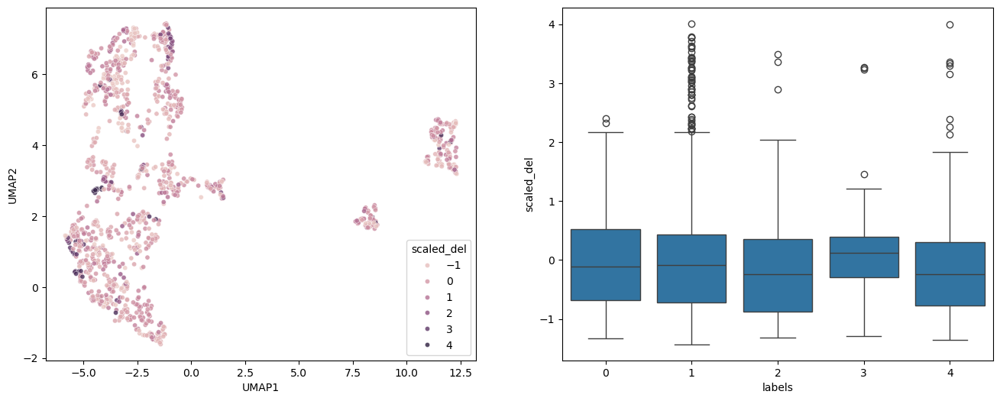

In [44]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="scaled_del", s=20, alpha=0.8, legend=True, ax = axes[0])

sns.boxplot(data = umap_df, x = "labels", y = "scaled_del", ax = axes[1])

plt.show()

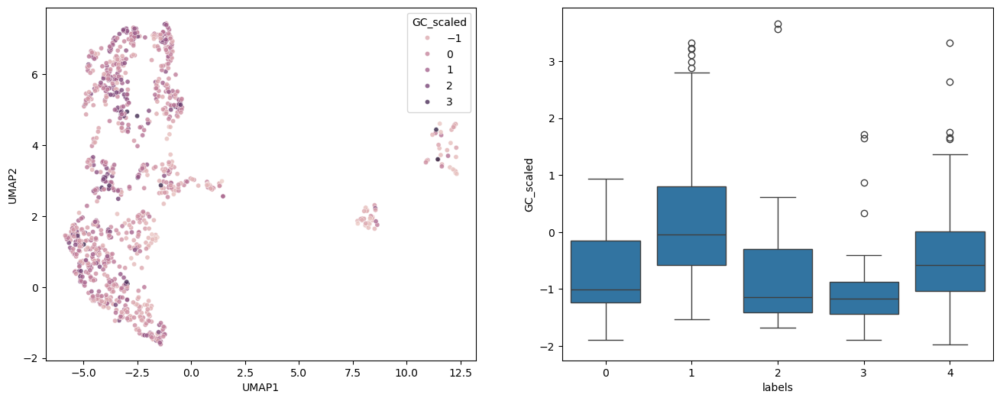

In [45]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="GC_scaled", s=20, alpha=0.8, legend=True, ax = axes[0])

sns.boxplot(data = umap_df, x = "labels", y = "GC_scaled", ax = axes[1])

plt.show()

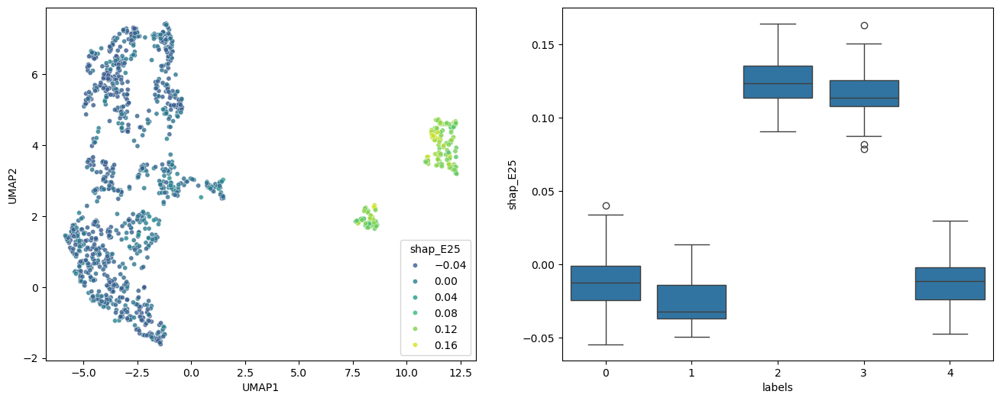

In [46]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="shap_E25", s=20, alpha=0.8, legend=True, ax = axes[0],
    palette=sns.color_palette("viridis", as_cmap=True), hue_norm=(vmin,vmax))

sns.boxplot(data = umap_df, x = "labels", y = "shap_E25", ax = axes[1])

plt.show()

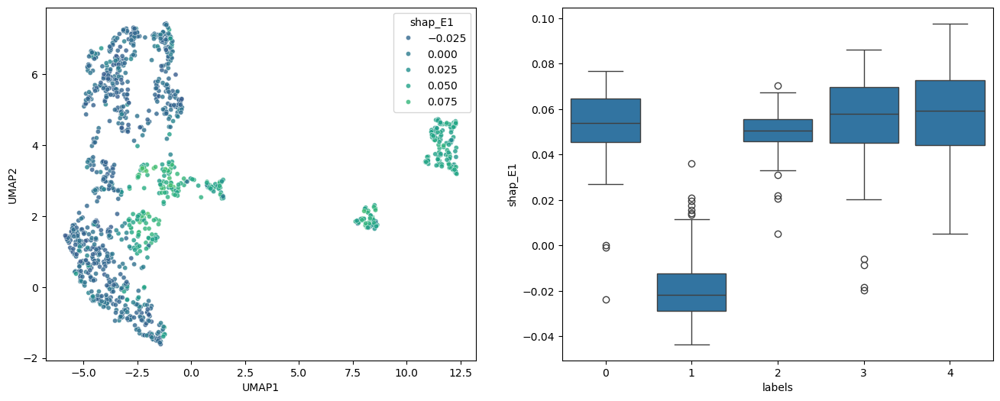

In [47]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="shap_E1", s=20, alpha=0.8, legend=True, ax = axes[0],
    palette=sns.color_palette("viridis", as_cmap=True), hue_norm=(vmin,vmax))

sns.boxplot(data = umap_df, x = "labels", y = "shap_E1", ax = axes[1])

plt.show()

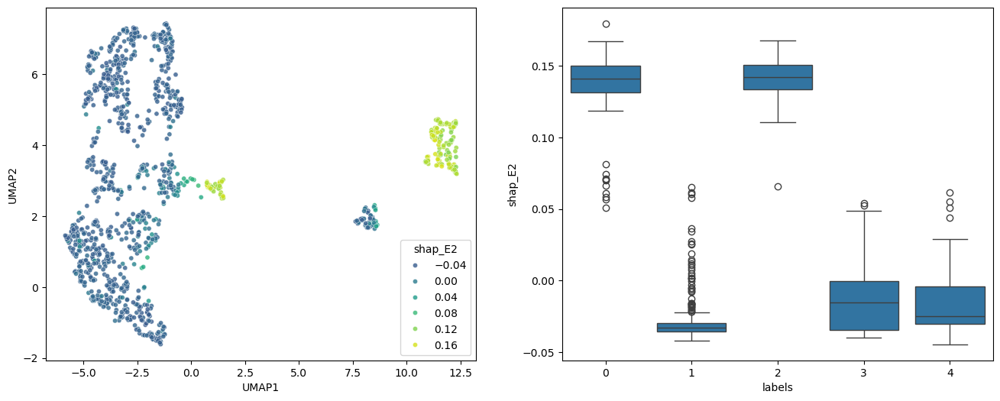

In [48]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="shap_E2", s=20, alpha=0.8, legend=True, ax = axes[0],
    palette=sns.color_palette("viridis", as_cmap=True), hue_norm=(vmin,vmax))

sns.boxplot(data = umap_df, x = "labels", y = "shap_E2", ax = axes[1])

plt.show()

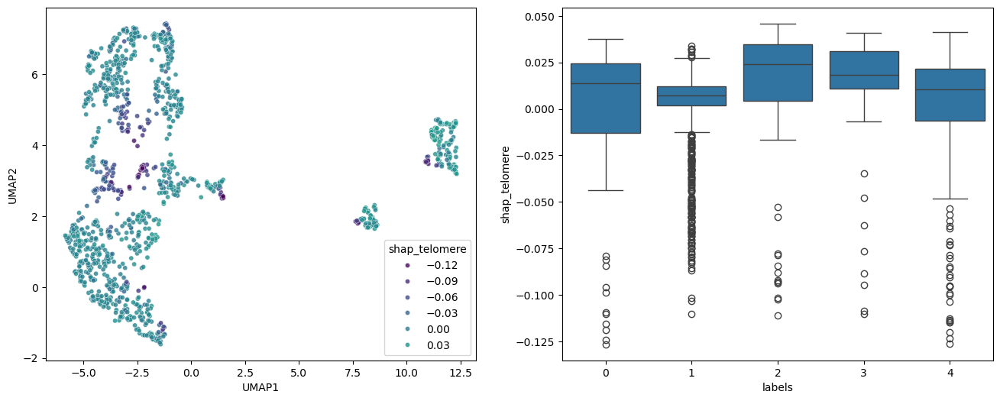

In [49]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="shap_telomere", s=20, alpha=0.8, legend=True, ax = axes[0],
    palette=sns.color_palette("viridis", as_cmap=True), hue_norm=(vmin,vmax))

sns.boxplot(data = umap_df, x = "labels", y = "shap_telomere", ax = axes[1])

plt.show()

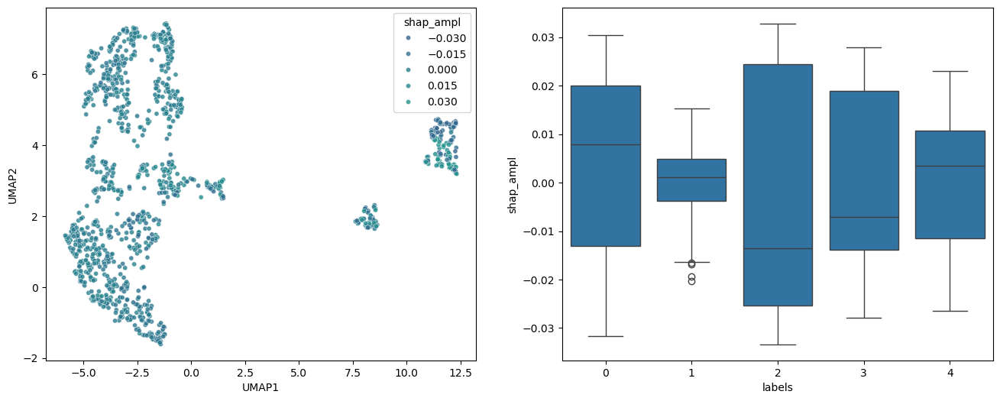

In [50]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="shap_ampl", s=20, alpha=0.8, legend=True, ax = axes[0],
    palette=sns.color_palette("viridis", as_cmap=True), hue_norm=(vmin,vmax))

sns.boxplot(data = umap_df, x = "labels", y = "shap_ampl", ax = axes[1])

plt.show()

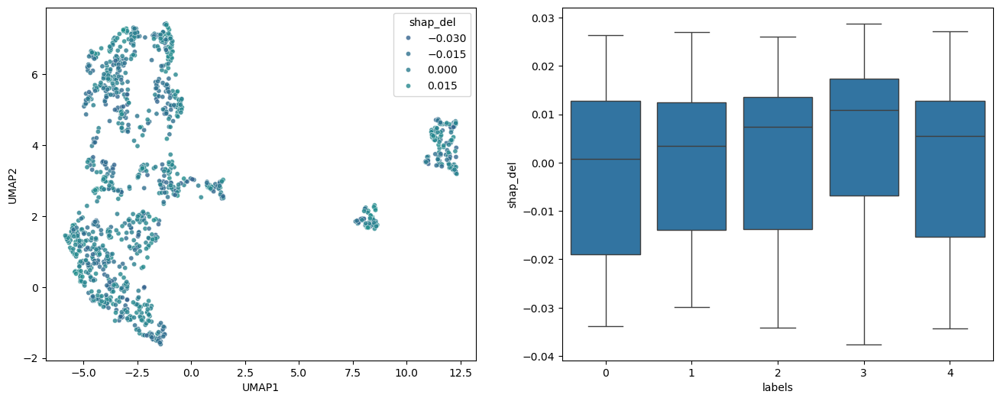

In [51]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="shap_del", s=20, alpha=0.8, legend=True, ax = axes[0],
    palette=sns.color_palette("viridis", as_cmap=True), hue_norm=(vmin,vmax))

sns.boxplot(data = umap_df, x = "labels", y = "shap_del", ax = axes[1])

plt.show()

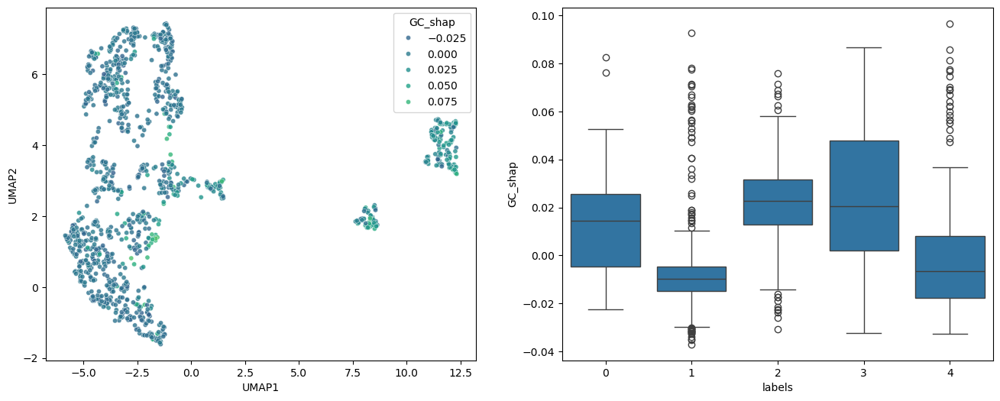

In [52]:
umap_df['labels'] = pd.Categorical(umap_df['labels'], categories=sorted(umap_df['labels'].unique()), ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="GC_shap", s=20, alpha=0.8, legend=True, ax = axes[0],
    palette=sns.color_palette("viridis", as_cmap=True), hue_norm=(vmin,vmax))

sns.boxplot(data = umap_df, x = "labels", y = "GC_shap", ax = axes[1])

plt.show()

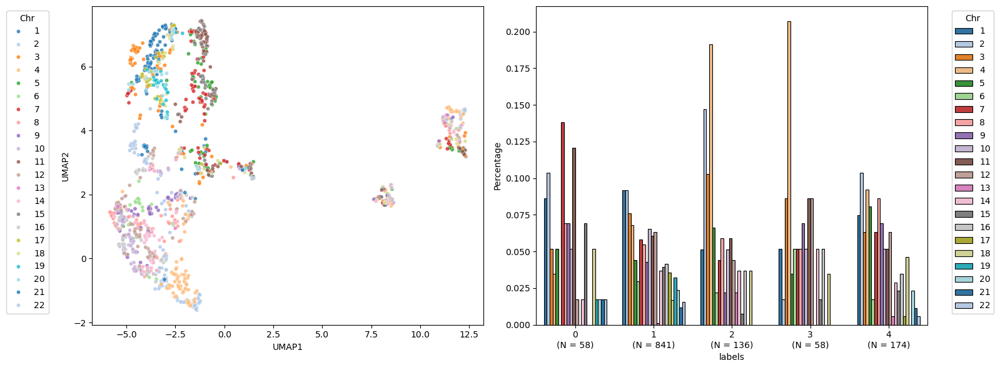

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

palette = sns.color_palette("tab20")

umap_df["labels"] = umap_df["labels"].astype(str)
elems_per_cluster["labels"] = elems_per_cluster["labels"].astype(str)

umap_df["chr"] = umap_df["chr"].astype(int)
umap_df = umap_df.sort_values("chr")

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="chr", s=20, alpha=0.8,
    palette=palette, legend=True, ax=axes[0]
)
axes[0].legend(title='Chr', frameon=True, framealpha=0.9, bbox_to_anchor=(-0.1, 1))

umap_df_discrete = (
    umap_df.groupby(["labels", "chr"])
    .size()
    .reset_index(name="counts")
)

umap_df_discrete = umap_df_discrete.merge(
    elems_per_cluster, on="labels", how="left"
)

umap_df_discrete["Percentage"] = (
    umap_df_discrete["counts"] / umap_df_discrete["elems_per_cluster"]
)

label_map = {
    row['labels']: f"{row['labels']}\n(N = {row['elems_per_cluster']})"
    for _, row in elems_per_cluster.iterrows()
}

barplot = sns.barplot(
    data=umap_df_discrete,
    x="labels", y="Percentage",
    hue="chr", palette=palette, ax=axes[1],
    hue_order=sorted(umap_df["chr"].unique())  # Enforce chromosome order
)

for patch in barplot.patches:
    patch.set_edgecolor('black')
    patch.set_linewidth(0.8)

axes[1].legend(title='Chr', frameon=True, framealpha=0.9, bbox_to_anchor=(1.05, 1))

new_labels = [label_map.get(tick.get_text(), tick.get_text()) for tick in axes[1].get_xticklabels()]
axes[1].set_xticklabels(new_labels)

plt.savefig("cluster_chr_plot.png", dpi=300)
plt.tight_layout()
plt.show()


In [ ]:
# Regions do not cluster perfectly with just one feature, can we do better with more features?

In [ ]:
# most separated clusters have higher residuals, but are those with higher observed values too. 
# What I am trying to prove is that the difference is not just because the model did not predict them correctly
# but more because of some underlying pattern. If those regions had not interesting observed values, but still high residuals,
# then the model would be wrong and the difference would be imputed to the model's error. 
# But it's completely normal that high residual regions are the ones with highest observed values, 
# because the model will only be able to explain them partially. This also mean that filtering for high residuals does not fix the issue, 
# but just ignores a feature

# looking at the last plot, no actual difference seems to arise in terms of residuals
# why chromosome 4

In [1]:
##### CHECK FOR TECHNICAL

# - AT / GC
#
# Nested Stichastic Block Methods
# Integrare ChIP per enrichment regioni TFs
# LADs
# prove ortogonali RNAseq per geni

In [54]:
umap_df["bin"] = regr_bin_train

In [55]:
umap_df_with_backbone = umap_df.merge(backbone, on = "bin")
umap_df_with_backbone["chr"] = umap_df_with_backbone["chr_x"] 
umap_df_with_backbone = umap_df_with_backbone.drop("chr_x", axis = 1)
umap_df_with_backbone = umap_df_with_backbone.drop("chr_y", axis = 1)
umap_df_with_backbone = umap_df_with_backbone.sort_values(["chr","start"])

In [56]:
umap_df_with_backbone["good_residual"] = (np.abs(umap_df_with_backbone.observed) - np.abs(umap_df_with_backbone.predicted)) > 0

In [57]:
umap_df_with_backbone

,UMAP1,UMAP2,driving_feats,labels,nSBM_labels,residuals,residuals_sign,observed,predicted,scaled_E25,...,shap_telomere,shap_ampl,shap_del,GC_scaled,GC_shap,bin,start,end,chr,good_residual
65,-3.099611,6.927638,distance.to.telomere,1,13,0.054885,0,0.074218,0.019332,0.218415,...,-0.060818,0.002697,0.020086,0.000645,-0.011211,1_8,7007043,8008048,1,True
19,-3.722098,6.689463,distance.to.telomere,1,43,0.038541,0,-0.064634,-0.103175,-1.717702,...,-0.052085,0.004467,0.023604,0.608058,0.001895,1_9,8008049,9009054,1,False
87,-3.005754,7.289367,9_92,1,10,-0.032417,0,0.013808,0.046225,-1.722453,...,-0.027977,-0.000764,0.024165,1.273443,-0.004483,1_10,9009055,10010060,1,False
101,-3.756580,6.789162,Length_Counts.E2,1,43,0.089037,0,0.134995,0.045958,-1.370626,...,-0.020445,0.001905,0.022202,1.599139,0.001986,1_12,11011067,12012072,1,True
49,-3.637767,6.876445,Centromere_Length,1,43,0.045127,0,0.177849,0.132722,0.477751,...,-0.023185,0.000400,0.016832,0.063214,-0.005356,1_15,14014085,15015090,1,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1266,-4.062987,3.043969,Length_Counts.E2,1,23,-0.038446,0,-0.324550,-0.286105,-0.643904,...,-0.027962,0.002119,0.015346,1.902602,-0.003723,22_40,39232870,40238840,22,True
1262,-3.969462,2.972151,distance.to.telomere,1,23,0.111915,0,-0.155064,-0.266979,-2.200271,...,-0.033186,0.000276,0.014885,1.133570,-0.002019,22_42,41244812,42250782,22,False
1258,-4.042825,3.098193,Length_Counts.E2,1,23,-0.042744,0,-0.228640,-0.185896,-1.472859,...,-0.032770,-0.002668,0.012763,1.748600,0.000654,22_43,42250783,43256753,22,True
1260,-3.995756,3.006663,distance.to.telomere,1,23,-0.152713,0,-0.393977,-0.241264,-2.615506,...,-0.050773,-0.005708,0.014540,1.774026,-0.000888,22_47,46274667,47280637,22,True


In [72]:
umap_df_with_backbone.loc[(umap_df_with_backbone.chr == 5) & (umap_df_with_backbone.labels == "2"),:]

,UMAP1,UMAP2,driving_feats,labels,nSBM_labels,residuals,residuals_sign,observed,predicted,scaled_E25,...,shap_telomere,shap_ampl,shap_del,GC_scaled,GC_shap,bin,start,end,chr,good_residual
474,11.484767,3.445360,Length_Counts.E2,2,54,0.162245,0,0.813763,0.651518,1.205171,...,-0.052596,0.027668,0.003691,NaN,0.018771,5_13,12061009,13066092,5,True
442,11.630617,3.401437,Length_Counts.E2,2,54,-0.244700,-1,0.189497,0.434197,1.167557,...,-0.001297,0.019216,-0.023090,0.224910,-0.023768,5_24,23116933,24122016,5,False
459,12.152730,3.316972,Length_Counts.E2,2,54,0.061401,0,0.790931,0.72953,1.186859,...,0.008086,0.022684,-0.003861,-1.595926,0.067325,5_25,24122017,25127100,5,True
479,12.008050,3.374789,Length_Counts.E2,2,54,-0.074202,0,0.547361,0.621562,1.160628,...,0.006818,0.025372,0.000595,-1.555502,0.071430,5_27,26132185,27137268,5,False
494,12.055048,3.400154,Length_Counts.E2,2,54,0.254470,1,0.961676,0.707205,1.123509,...,0.006735,0.023908,0.009527,NaN,0.014899,5_28,27137269,28142352,5,True
453,11.576599,3.477909,Length_Counts.E2,2,54,0.042754,0,0.634308,0.591553,1.172506,...,0.004991,0.022588,0.000214,NaN,0.013266,5_30,29147437,30152520,5,True
445,12.010224,3.372850,Length_Counts.E2,2,54,-0.003644,0,0.612090,0.615735,1.221998,...,0.035916,0.020018,0.013930,NaN,0.027630,5_101,100508401,101513484,5,False
470,11.485634,3.554092,Length_Counts.E2,2,54,-0.076369,0,0.310969,0.387338,1.194283,...,0.002877,0.028698,0.019308,NaN,-0.003450,5_144,143727013,144732096,5,False
446,11.978076,3.360708,Length_Counts.E2,2,54,0.339007,1,0.951066,0.612059,1.211605,...,-0.010326,0.029755,0.020744,NaN,0.025404,5_165,164833777,165838860,5,True


In [ ]:
# what did we find as really interesting?


# ADGRL3 in 4_63, in this case the model DOES NOT see this closing, and predicts 0, but there it is an interesting region
# UGT8 in 4_116
# LNCPRESS2 in 4_94
# miRNA1973 in 4_118

In [85]:
to_save_0 = umap_df_with_backbone.loc[(umap_df_with_backbone.labels == "0"),:]
to_save_0.to_csv("./cluster_0_new.csv", header = True, index = False, sep = "\t")

In [ ]:
to_save_1 = umap_df_with_backbone.loc[(umap_df_with_backbone.labels == "1"),:]
to_save_1.to_csv("./cluster_1_new.csv", header = True,s index = False, sep = "\t")

In [87]:
to_save_2 = umap_df_with_backbone.loc[(umap_df_with_backbone.labels == "2"),:]
to_save_2.to_csv("./cluster_2_new.csv", header = True, index = False, sep = "\t")

In [88]:
to_save_3 = umap_df_with_backbone.loc[(umap_df_with_backbone.labels == "3"),:]
to_save_3.to_csv("./cluster_3_new.csv", header = True, index = False, sep = "\t")

In [89]:
to_save_4 = umap_df_with_backbone.loc[(umap_df_with_backbone.labels == "4"),:]
to_save_4.to_csv("./cluster_4_new.csv", header = True, index = False, sep = "\t")

## Driver Identification

In [1]:
import distfit

In [15]:
errors_df["good_residual"] = np.where(errors_df.observed > 0, errors_df.observed - errors_df.predicted, errors_df.predicted - errors_df.observed)

[03-07-2025 14:54:15] [matplotlib.category] [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
[03-07-2025 14:54:15] [matplotlib.category] [INFO] Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


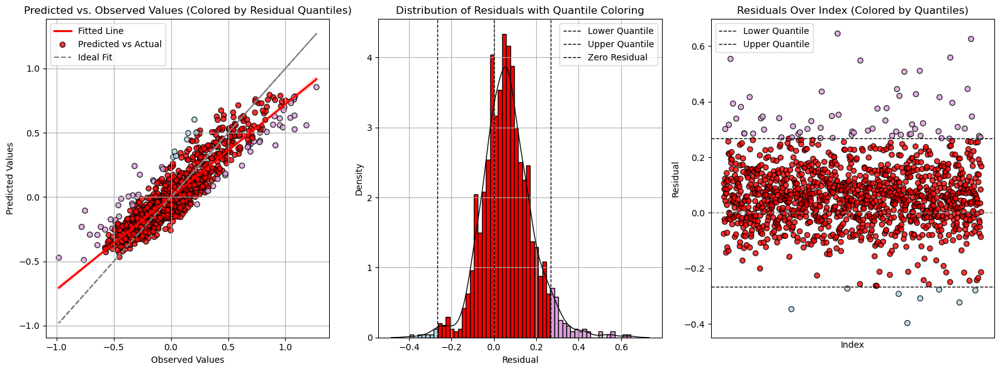

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors

fig, axes = plt.subplots(1, 3, figsize=(16, 6))

residuals = errors_df['good_residual'].to_numpy()
upper_quantile = np.quantile(residuals, 0.95)
lower_quantile = -upper_quantile

colors_points = np.where(
    residuals < lower_quantile, 'lightblue',
    np.where(residuals > upper_quantile, 'plum', 'red')
)

y_true = y_train.to_numpy()
y_pred = predictions_array.to_numpy()

sns.regplot(x=y_true, y=y_pred, scatter=False, color='red', label='Fitted Line', ax=axes[0])
axes[0].scatter(y_true, y_pred, c=colors_points, edgecolor='black', alpha=0.8, label='Predicted vs Actual')
axes[0].plot(y_true, y_true, color='gray', linestyle='--', label='Ideal Fit')
axes[0].set_xlabel("Observed Values")
axes[0].set_ylabel("Predicted Values")
axes[0].set_title("Predicted vs. Observed Values (Colored by Residual Quantiles)")
axes[0].legend()
axes[0].grid(True)

bins = 55
hist, bin_edges = np.histogram(residuals, bins=bins, density=True)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

# Determine color for each bin center based on quantiles
colors_hist = np.where(
    bin_centers < lower_quantile, 'lightblue',
    np.where(bin_centers > upper_quantile, 'plum', 'red')
)

for count, x, left, right, color in zip(hist, bin_centers, bin_edges[:-1], bin_edges[1:], colors_hist):
    axes[1].bar(x, count, width=right-left, color=color, edgecolor='black', align='center')

sns.kdeplot(residuals, color='black', linewidth=1, ax=axes[1])
axes[1].axvline(lower_quantile, color='black', linestyle='--', linewidth=1, label='Lower Quantile')
axes[1].axvline(upper_quantile, color='black', linestyle='--', linewidth=1, label='Upper Quantile')
axes[1].axvline(0, color='black', linestyle='--', linewidth=1, label='Zero Residual')
axes[1].set_xlabel("Residual")
axes[1].set_ylabel("Density")
axes[1].set_title("Distribution of Residuals with Quantile Coloring")
axes[1].legend()
axes[1].grid(True)

axes[2].scatter(
    errors_df.index, residuals, 
    c=colors_points, edgecolor='black', alpha=0.8
)
axes[2].axhline(0, color='gray', linestyle='--', linewidth=1)
axes[2].axhline(lower_quantile, color='black', linestyle='--', linewidth=1, label='Lower Quantile')
axes[2].axhline(upper_quantile, color='black', linestyle='--', linewidth=1, label='Upper Quantile')
axes[2].set_xlabel("Index")
axes[2].set_ylabel("Residual")
axes[2].set_title("Residuals Over Index (Colored by Quantiles)")
axes[2].legend()
axes[2].set_xticks([])
axes[2].grid(False)

plt.tight_layout()
plt.show()

In [18]:
dist_good_res = distfit.distfit(alpha=0.01)
dist_good_res.fit_transform(errors_df.good_residual)
dist_good_res_best = dist_good_res.model

#dist_good_res.plot_summary()
#dist_good_res.plot_cdf()
#dist_good_res.qqplot(errors_df.residual)

pvals_not_adj = dist_good_res.model["model"].sf(errors_df.good_residual.astype(float).to_numpy())

errors_df["pvals"] = pvals_not_adj

[03-07-2025 14:54:47] [distfit.distfit] [INFO] fit
[03-07-2025 14:54:47] [distfit.distfit] [INFO] transform
[03-07-2025 14:54:47] [distfit.distfit] [INFO] [norm      ] [0.00 sec] [RSS: 4.13994] [loc=0.063 scale=0.120]
[03-07-2025 14:54:47] [distfit.distfit] [INFO] [expon     ] [0.00 sec] [RSS: 80.2987] [loc=-0.397 scale=0.460]
[03-07-2025 14:54:47] [distfit.distfit] [INFO] [pareto    ] [0.00 sec] [RSS: 80.2987] [loc=-33554432.397 scale=33554432.000]
[03-07-2025 14:54:47] [distfit.distfit] [INFO] [dweibull  ] [0.00 sec] [RSS: 1.9569] [loc=0.055 scale=0.093]
[03-07-2025 14:54:48] [distfit.distfit] [INFO] [t         ] [0.07 sec] [RSS: 1.93947] [loc=0.059 scale=0.095]
[03-07-2025 14:54:48] [distfit.distfit] [INFO] [genextreme] [0.07 sec] [RSS: 4.72414] [loc=0.015 scale=0.117]
[03-07-2025 14:54:48] [distfit.distfit] [INFO] [gamma     ] [0.04 sec] [RSS: 3.48421] [loc=-1.221 scale=0.011]
[03-07-2025 14:54:48] [distfit.distfit] [INFO] [lognorm   ] [0.03 sec] [RSS: 3.40095] [loc=-1.648 scale=1.

In [23]:
errors_df_with_backbone = errors_df.merge(backbone, on = "bin")

In [24]:
errors_df_with_backbone

,bin,observed,predicted,residual,idx,good_residual,pvals,pvals_adj,chr,start,end
0,11_26,0.448878,0.524681,-0.075803,307,-0.075803,0.892755,0.974254,chr11,25001201,26001248
1,14_93,-0.225496,-0.120014,-0.105482,539,0.105482,0.321514,0.974254,chr14,92300473,93303738
2,4_102,0.210953,0.154258,0.056695,1212,0.056695,0.507887,0.974254,chr4,101081508,102082314
3,16_62,0.444309,0.359302,0.085007,646,0.085007,0.396384,0.974254,chr16,61240402,62244342
4,3_169,-0.015019,-0.038935,0.023916,1131,-0.023916,0.788075,0.974254,chr3,168018985,169019097
...,...,...,...,...,...,...,...,...,...,...,...
1262,1_70,0.421245,0.33759,0.083654,127,0.083654,0.401559,0.974254,chr1,69069415,70070420
1263,12_103,0.076473,0.163508,-0.087035,373,-0.087035,0.908035,0.974254,chr12,102653311,103659715
1264,5_86,0.159099,0.373195,-0.214096,1460,-0.214096,0.983341,0.996381,chr5,85432141,86437224
1265,1_185,-0.198808,-0.19587,-0.002938,51,0.002938,0.708602,0.974254,chr1,184185105,185186110


In [ ]:
opening_005 = errors_df_with_backbone[(errors_df_with_backbone.observed > 0) & (errors_df_with_backbone.pvals < 0.05)]
opening_001 = errors_df_with_backbone[(errors_df_with_backbone.observed > 0) & (errors_df_with_backbone.pvals < 0.01)]

In [38]:
closing_005 = errors_df_with_backbone[(errors_df_with_backbone.observed < 0) & (errors_df_with_backbone.pvals < 0.05)]
closing_001 = errors_df_with_backbone[(errors_df_with_backbone.observed < 0) & (errors_df_with_backbone.pvals < 0.01)]

In [ ]:
regions_005 = errors_df_with_backbone[(errors_df_with_backbone.pvals < 0.05)]
regions_001 = errors_df_with_backbone[(errors_df_with_backbone.pvals < 0.01)]

In [44]:
regions_005.to_csv("./regions_005.csv", header = True, index = False, sep = "\t")
regions_001.to_csv("./regions_001csv", header = True, index = False, sep = "\t")

### SHAP values Bimodal Trend

In [75]:
unique_classes = annot_with_coords["chr"].unique()
palette = sns.color_palette("Set2", len(unique_classes))
class_color_map = dict(zip(unique_classes, palette))

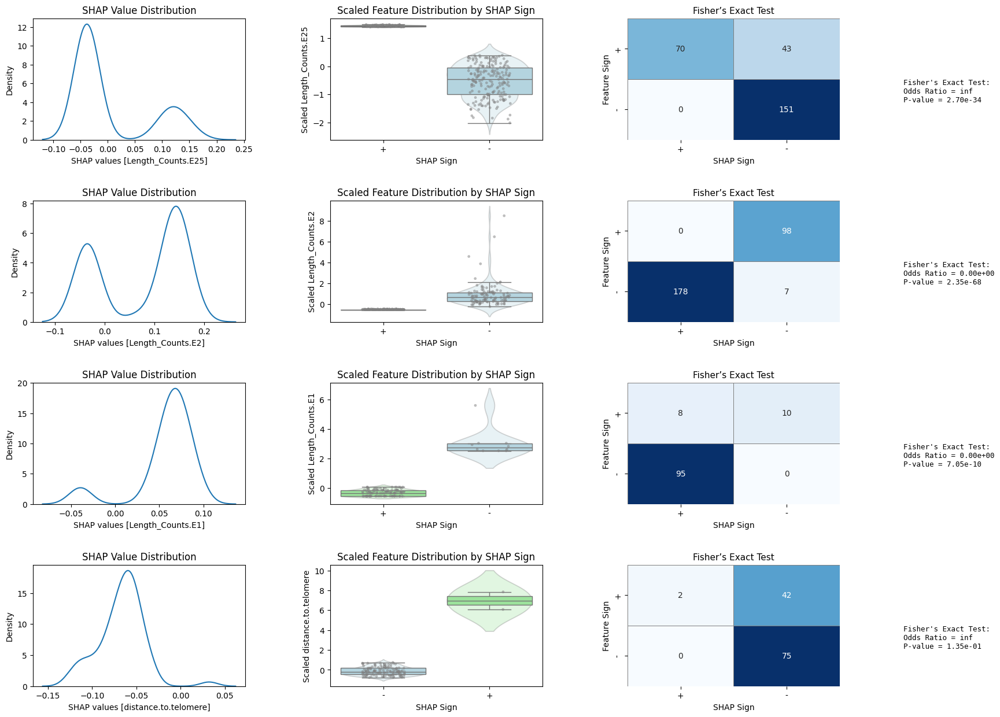

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def plot_shap_feature_relationship(feature, annot_with_coords, regr_X_train_reduced, regr_bin_train, class_color_map, row_axes):
    import scipy.stats as sp
    from scipy.stats import fisher_exact
    from sklearn.preprocessing import StandardScaler

    feature_c = "predicted"
    feature_b = "associated_shap"
    feature_a1 = feature

    # Prepare data
    train_vals = pd.DataFrame([regr_X_train_reduced[feature_a1], regr_bin_train]).transpose()
    train_vals.columns = [feature_a1, "bin"]

    subset_df = annot_with_coords[annot_with_coords.annotation == feature_a1]
    subset_df = pd.merge(subset_df, train_vals, on="bin")

    subset_df['predicted'] = pd.to_numeric(subset_df['predicted'], errors='coerce')
    subset_df[feature_a1] = pd.to_numeric(subset_df[feature_a1], errors='coerce')

    subset_df["sign"] = subset_df["associated_shap"].apply(lambda x: "+" if x >= 0 else "-")
    scaler = StandardScaler()
    subset_df["scaled_feat"] = scaler.fit_transform(subset_df[[feature_a1]])
    subset_df["sign_feat"] = subset_df["scaled_feat"].apply(lambda x: "+" if x >= 0 else "-")

    ab_contingency = pd.crosstab(subset_df["sign_feat"], subset_df["sign"])
    fisher_result_str = ""
    show_heatmap = False
    if ab_contingency.shape == (2, 2):
        fisher_odds_ratio, fisher_pval = fisher_exact(ab_contingency)
        show_heatmap = True
        fisher_result_str = f"Fisher's Exact Test:\nOdds Ratio = {fisher_odds_ratio:.2e}\nP-value = {fisher_pval:.2e}"
    else:
        fisher_result_str = f"Fisher's Exact Test not applicable\n(table shape: {ab_contingency.shape})"

    subset_df_plus = subset_df[subset_df['sign'] == '+']
    subset_df_minus = subset_df[subset_df['sign'] == '-']
    rho_plus, pval_plus = sp.spearmanr(subset_df_plus[feature_a1], subset_df_plus[feature_b])
    rho_minus, pval_minus = sp.spearmanr(subset_df_minus[feature_a1], subset_df_minus[feature_b])
    text_plus = f"Spearman ρ (+): {rho_plus:.2f}\nP-value: {pval_plus:.2e}"
    text_minus = f"Spearman ρ (−): {rho_minus:.2f}\nP-value: {pval_minus:.2e}"

    sns.kdeplot(subset_df["associated_shap"], ax=row_axes[0])
    row_axes[0].set_xlabel(f"SHAP values [{feature}]")
    row_axes[0].set_title("SHAP Value Distribution")

    sns.boxplot(
    x="sign", y="scaled_feat", hue="sign", legend=False,
    data=subset_df,
    palette={"+" : "lightgreen", "-" : "lightblue"},
    ax=row_axes[1], fliersize=0
    )
    sns.violinplot(
    x="sign", y="scaled_feat", hue="sign",
    data=subset_df,
    palette={"+" : "lightgreen", "-" : "lightblue"},
    ax=row_axes[1], inner=None, alpha=0.3, legend=False
    )
    sns.stripplot(
    x="sign", y="scaled_feat", hue="sign",
    data=subset_df,
    palette={"+" : "gray", "-" : "gray"},
    ax=row_axes[1], dodge=False, jitter=0.2, size=3, alpha=0.5, edgecolor='0.5', linewidth=0.3, legend=False
    )
    
    row_axes[1].set_xlabel("SHAP Sign")
    row_axes[1].set_ylabel(f"Scaled {feature_a1}")
    row_axes[1].set_title("Scaled Feature Distribution by SHAP Sign")

    row_axes[2].set_title("Fisher’s Exact Test", fontsize=11)
    if show_heatmap:
        sns.heatmap(ab_contingency, annot=True, fmt="d", cmap="Blues", cbar=False, ax=row_axes[2],
                    linewidths=0.5, linecolor='gray')
        row_axes[2].set_xlabel("SHAP Sign")
        row_axes[2].set_ylabel("Feature Sign")
        row_axes[2].text(1.3, 0.5, fisher_result_str,
                         transform=row_axes[2].transAxes,
                         fontsize=9, ha='left', va='top', family='monospace')
    else:
        row_axes[2].axis('off')
        row_axes[2].text(0.5, 0.5, fisher_result_str, fontsize=9,
                         ha='center', va='center', family='monospace')

    return(subset_df)
    
    
features = ["Length_Counts.E25", "Length_Counts.E2", "Length_Counts.E1", "distance.to.telomere"]
df_list = []

fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 15), gridspec_kw={'wspace': 0.4, 'hspace': 0.5})

for i, feature in enumerate(features):
    row_axes = axes[i]
    subset_df = plot_shap_feature_relationship(
        feature=feature,
        annot_with_coords=annot_with_coords,
        regr_X_train_reduced=regr_X_train_reduced,
        regr_bin_train=regr_bin_train,
        class_color_map=class_color_map,
        row_axes=row_axes
    )

    df_list.append(subset_df)

plt.subplots_adjust(wspace=0.4, hspace=0.5)
plt.savefig('./imgs/sc_1Mbp_features_fischer.png')
plt.show()


## SHAP analysis - Sign AWARE annotation

In [181]:
explainer = shap.TreeExplainer(regr_model, approximate= False)
shap_values = explainer(regr_X_train_reduced)

In [182]:
shap_vals_df = pd.DataFrame(shap_values.values, columns= regr_X_train_reduced.columns, index = regr_X_train_reduced.index)

In [183]:
scaler = StandardScaler()
scaled_train = pd.DataFrame(scaler.fit_transform(regr_X_train_reduced), columns = regr_X_train_reduced.columns, index = regr_X_train_reduced.index)

In [184]:
associated_chr = regr_bin_train.str.split("_").apply(lambda x: x[0])

In [186]:
annot = np.abs(shap_vals_df).idxmax(axis = 1)
feats = annot.values.tolist()
index = annot.index.tolist()

sign_list = []
for i in range(len(feats)):
    actual_feat = feats[i]
    actual_index = index[i]
    actual_sign = np.sign(shap_vals_df.loc[actual_index, actual_feat])

    actual_sign_str = "" if actual_sign == 1.0 else "-"
    sign_list.append(actual_sign_str)

sign_list = pd.Series(sign_list, name="sign", index=shap_vals_df.index)

In [187]:
driving_df = pd.DataFrame({"annot":driving_feats, "sign":sign_list})

In [188]:
driving_df["sign_aware_annot"] = driving_df["sign"] + driving_df["annot"]

In [189]:
driving_feats = driving_df["sign_aware_annot"]

In [190]:
warnings.filterwarnings("ignore")

kmeans = KMeans(n_clusters=5, random_state=4843)
kmeans.fit(shap_vals_df)
labels = kmeans.labels_
cluster_centers = kmeans.cluster_centers_

umap_model = umap.UMAP(n_components=2, random_state=42)
umap_embedding = umap_model.fit_transform(shap_vals_df)
umap_df = pd.DataFrame(umap_embedding, columns=["UMAP1", "UMAP2"], index = shap_vals_df.index)

umap_df["driving_feats"] = driving_feats
umap_df["labels"] = labels
umap_df["residuals"] = errors_df.residual
umap_df["residuals_sign"] = np.where(errors_df.residual < lower_quantile, -1, np.where(errors_df.residual > upper_quantile, 1, 0))
umap_df["observed"] = regr_y_train
umap_df["predicted"] = errors_df["predicted"]
umap_df["scaled_E25"] = scaled_train["Length_Counts.E25"] 
umap_df["scaled_E2"] = scaled_train["Length_Counts.E2"]
umap_df["scaled_E1"] = scaled_train["Length_Counts.E1"]
umap_df["scaled_telomere"] = scaled_train["distance.to.telomere"]
umap_df["chr"] = associated_chr

elems_per_cluster = umap_df.groupby("labels").size().reset_index(name="elems_per_cluster")

centers_2d = umap_model.transform(cluster_centers)

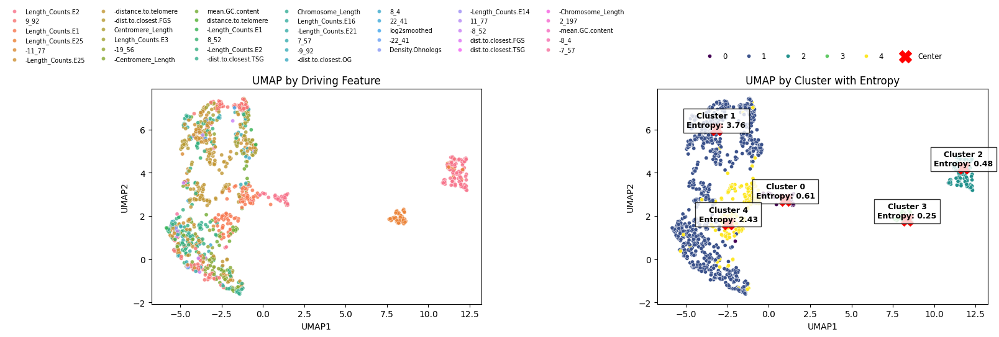

In [196]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

sns.scatterplot(
    x="UMAP1", y="UMAP2", hue="labels", palette="viridis",
    data=umap_df, s=20, ax=axes[1], legend=True
)
axes[1].scatter(
    centers_2d[:, 0], centers_2d[:, 1], c='red', marker='X', s=200, label='Center'
)

for i, center in enumerate(centers_2d):
    idxs = np.where(umap_df["labels"] == i)[0]
    cluster_df = umap_df.iloc[idxs]
    cluster_true_labels = cluster_df["driving_feats"]
    
    total = len(cluster_true_labels)
    counts = Counter(cluster_true_labels)
    probs = [count / total for count in counts.values()]
    ent = sp.stats.entropy(probs, base=2)

    text = f"Cluster {i}\nEntropy: {ent:.2f}"
    axes[1].text(
        center[0], center[1] + 0.4,
        text, fontsize=9, fontweight='bold',
        ha='center', va='center',
        bbox=dict(facecolor='white', alpha=0.8, edgecolor='black')
    )

axes[1].set_title("UMAP by Cluster with Entropy")

handles0, labels0 = axes[1].get_legend_handles_labels()
axes[1].legend(
    handles=handles0, labels=labels0,
    loc='upper center', bbox_to_anchor=(0.5, 1.20),
    ncol=len(np.unique(labels)) + 2, fontsize='small', frameon=False
)

scatter1 = sns.scatterplot(
    data=umap_df, x="UMAP1", y="UMAP2",
    hue="driving_feats", s=20, alpha=0.8, ax=axes[0], legend=True
)
axes[0].set_title("UMAP by Driving Feature")

handles1, labels1 = axes[0].get_legend_handles_labels()
axes[0].legend(
    handles=handles1, labels=labels1,
    loc='upper center', bbox_to_anchor=(0.5, 1.40),  # Move it up slightly
    ncol=7,  # Increase columns
    fontsize='x-small', frameon=False
)

plt.tight_layout()
plt.show()

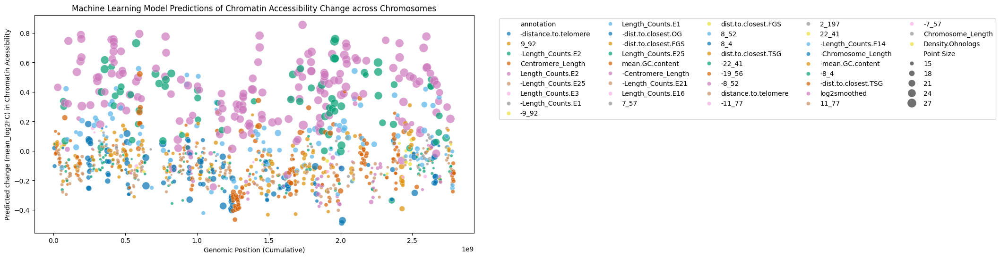

In [211]:
cols_idxs = np.argmax(np.abs(shap_vals_df), axis = 1)

cols_occurrences = pd.Series(regr_X_train_reduced.columns[cols_idxs], index= regr_bin_train.index, name = "annotation")
extracted_values = pd.Series([shap_vals_df.iloc[i, cols_idxs[i]] for i in range(len(shap_vals_df))], 
                             index = regr_X_train_reduced.index, name= "associated_shap")

annot_with_bins = pd.concat([regr_bin_train, cols_occurrences, extracted_values], axis = 1)
annot_with_bins["annotation"] = driving_feats

annot_with_coords = pd.merge(left = annot_with_bins, right = backbone, how = "inner", on = "bin")
annot_with_coords = pd.merge(left = annot_with_coords, right = errors_df[["bin","predicted"]], how = "inner", on = "bin")
annot_with_coords = annot_with_coords[["bin", "chr", "start", "end", "annotation", "associated_shap", "predicted"]]

df = annot_with_coords.copy(deep = True)

df["midpoint"] = (df["start"] + df["end"]) / 2

df.sort_values(["chr", "start"], inplace=True)

chr_offsets = {chrom: offset for chrom, offset in zip(df["chr"].unique(), np.cumsum([0] + list(df.groupby("chr")["end"].max()[:-1])))}
df["cumulative_midpoint"] = df["midpoint"] + df["chr"].map(chr_offsets)

df["Point Size"] = (df["associated_shap"].abs() * 100) + 10

plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=df,
    x="cumulative_midpoint",
    y="predicted",
    hue="annotation",
    size="Point Size",
    sizes=(10, 200),
    palette="colorblind",
    alpha=0.7
)

plt.xlabel("Genomic Position (Cumulative)")
plt.ylabel("Predicted change (mean_log2FC) in Chromatin Acessibility")
plt.title("Machine Learning Model Predictions of Chromatin Accessibility Change across Chromosomes")
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', ncol = 5)

plt.savefig('./imgs/sc_1Mbp_bubble.png')
plt.show()

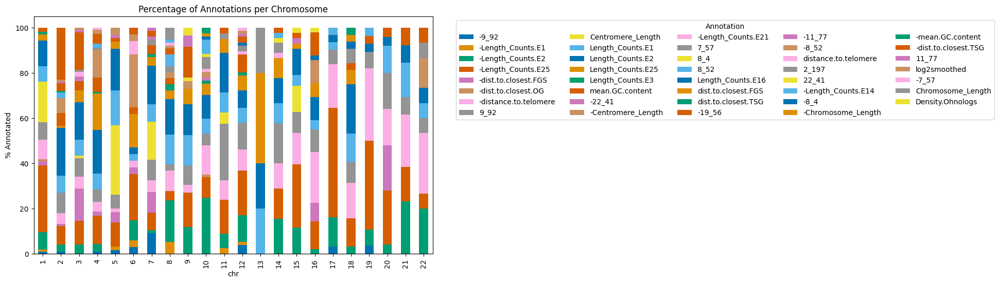

In [210]:
annot_count_per_chr = df.groupby(["chr","annotation"]).count().loc[:,"bin"].reset_index().rename(columns={"bin": "annot_counts"})
bin_counts_per_chr = df.groupby(["chr"]).count().loc[:,"bin"].reset_index().rename(columns={"bin": "bin_count"})

merged_df = annot_count_per_chr.merge(bin_counts_per_chr, on='chr', how='inner')
merged_df["perc_annot"] = (merged_df["annot_counts"] / merged_df["bin_count"])*100

import matplotlib.pyplot as plt
import seaborn as sns

annotation_order = merged_df['annotation'].drop_duplicates().tolist()

pivot_df = merged_df.pivot(index='chr', columns='annotation', values='perc_annot').fillna(0)
pivot_df = pivot_df[annotation_order]

pivot_df = pivot_df.set_index(pivot_df.index.str.replace("chr","").astype(int))
pivot_df = pivot_df.sort_index()

n_colors = len(annotation_order)
colors = sns.color_palette("colorblind", n_colors=n_colors)
pivot_df.plot(kind='bar', stacked=True, color=colors, figsize=(10, 6))

plt.ylabel('% Annotated')
plt.title('Percentage of Annotations per Chromosome')
plt.legend(title='Annotation', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=5)
plt.tight_layout()
plt.show()
